[![Open in Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/Nishani53/Khanal_MSc_Thesis_MSU/blob/main/Forest%20Coverage%20Analysis%20August%202025/Forest%20Coverage%20Analysis%20August%202025.ipynb)


# 🌲 Forest Market Coverage & Forest Area Overlay Analysis

This repository contains scripts and data for quantifying **forest area** within **procurement zones** of biomass, hardwood, softwood, and pulpwood markets in Michigan, across multiple decades.  
It also identifies how much forest land was **retained**, **lost**, or **newly added** to market coverage between years, broken down by **forest type**.

---

## 📌 Objective

To accurately measure forestland within market coverage zones for:

- 🌳 **Hardwood Sawlogs**
- 🌲 **Softwood Sawlogs**
- 🧻 **Pulpwood**
- 🔥 **Biomass**

The workflow overlays **market coverage shapefiles** with **forest cover and forest type rasters** to calculate area (in acres) by forest group and track temporal changes.

---

## 🗺️ Data Sources

### 1. **Market Coverage Shapefiles**
- Represent procurement zones for different products and years.
- Contain a `status` field with:
  - **Market Retain** – areas present in both time periods
  - **Market Loss** – areas present in earlier period only
  - **Market Add** – areas new in the later period

### 2. **Competition Class Hotspot Maps**
- Dissolved polygons showing overlapping procurement zones.
- Classified into:
  - `1 - Lowest`
  - `2 - Low`
  - `3 - Medium`
  - `4 - High`

### 3. **Forest Cover & Forest Type Rasters**
- **NLCD Land Cover** (2001, 2019) – identifies forest/non-forest pixels.
- **FIA Forest Type Groups** – classifies forest by species group.
- ~30m resolution.

---

## 🧠 Method Overview

1. **Reprojection** – All shapefiles reprojected to raster CRS.
2. **Raster Clipping** – Each polygon masks the raster to extract only relevant pixels.
3. **Filtering** – Select only valid forest classes or forest type groups.
4. **Area Calculation** – Count pixels × pixel area (m²) → acres.
5. **Summarization** – Report total forest area and breakdown by forest type.

---

## 🛠️ Python Libraries Used

- [`geopandas`](https://geopandas.org/) – vector data handling
- [`matplotlib`](https://matplotlib.org/) – mapping and visualization
- [`rasterio`](https://rasterio.readthedocs.io/) – raster I/O and masking
- [`fiona`](https://fiona.readthedocs.io/) – shapefile I/O
- [`shapely`](https://shapely.readthedocs.io/) – geometry operations
- [`pyproj`](https://pyproj4.github.io/pyproj/stable/) – coordinate transformations
- [`numpy`](https://numpy.org/) – pixel counting and calculations

---

## 📈 Output Examples

For each polygon:
- **Total forest area** (acres)
- **Forest area by type group** (acres)
- Side-by-side plots of **undissolved** (competition classes) vs. **dissolved** (full coverage)

Example change classification visualization:

| Status         | Color      |
|----------------|------------|
| Market Retain  | Light Gray |
| Market Loss    | Red        |
| Market Add     | Blue       |

---

## 📂 Repository Structure

```
Data/
    biomass_coverage_*.shp
    biomass_change_*-*.shp
    hardwood_coverage_*.shp
    hardwood_change_*-*.shp
    softwood_coverage_*.shp
    softwood_change_*-*.shp
    pulpwood_coverage_*.shp
    pulpwood_change_*-*.shp
    *_hotspots_*.shp
    Counties_(v17a).shp
    forest_cover_2019.tif
    lulc2001.tif
Scripts/
    01_generate_change_shapefiles.py
    02_visualize_changes.py
    03_forest_cover_area_calculation.py
    04_forest_type_area_calculation.py
Outputs/
    Plots/
    Tables/
README.md
```

---

## 🚀 Usage

**Run in Colab:**  
Click the badge at the top to open the main notebook in Google Colab with all dependencies pre-installed.

**Local Execution:**  
1. Clone the repository:
```bash
git clone https://github.com/Nishani53/Khanal_MSc_Thesis_MSU.git
```
2. Install dependencies:
```bash
pip install geopandas matplotlib rasterio fiona shapely pyproj numpy
```
3. Run analysis scripts from the `Scripts` folder.

---

## 📅 Time Periods Analyzed
- **1985–1994**
- **1994–2002**
- **2002–2018**
- **2018–2023**
- **1985–2023** (long-term change)

---

## 📜 License
This repository is for academic research. Please contact the author before reuse or redistribution.


In [1]:
!pip install rasterio geopandas shapely
!pip install geopandas fiona
!pip install matplotlib-scalebar
!pip install gdown
!pip install pydrive
!pip install matplotlib-scalebar


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 21.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.6/56.6 kB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 70.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 987.4/987.4 kB 16.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pydrive: filename=PyDrive-1.3.1-py3-none-any.whl size=27433 sha256=0c107b99e77fd0f5d82b71ecb42fec8f41cb8f604b6684dcde882f0e71c85424
  Stored in directory: /root/.cache/pip/wheels/31/d5/09/88865e0059104686eb8365ca1d36a8b27deef34232c3b62c90
Successfully built pydrive


In [2]:
# 📁 Step 1: Clean Colab working directory
%cd /content
!rm -rf sample_data/ repo.zip Khanal_MSc_Thesis_MSU-main "Market Coverage August 11.7z"

# 🛠️ Step 2: Install 7-Zip
!apt-get install -y p7zip-full

# 📥 Step 3: Download your GitHub repo
!curl -L -o repo.zip https://github.com/Nishani53/Khanal_MSc_Thesis_MSU/archive/refs/heads/main.zip
!unzip -q repo.zip

# 📂 Step 4: Navigate to folder containing Market Coverage August 11.7z
%cd "Khanal_MSc_Thesis_MSU-main/Forest Coverage Analysis August 2025/Data"

# 📥 Step 5: Download Market Coverage August 11.7z (if you want fresh copy from GitHub)
!curl -L -o "Market Coverage August 11.7z" "https://github.com/Nishani53/Khanal_MSc_Thesis_MSU/raw/main/Forest%20Coverage%20Analysis%20August%202025/Data/Market%20Coverage%20August%2011.7z"

# 📂 Step 6: Extract the .7z file (contains Market Coverage August 11/Data)
!7z x -y "Market Coverage August 11.7z"

# 📂 Step 7: Set base path to extracted Data folder
base_path = "/content/Khanal_MSc_Thesis_MSU-main/Forest Coverage Analysis August 2025/Data/Market Coverage August 11/Data"

import os

print("📁 Listing all files in extracted Data folder:\n")
for root, dirs, files in os.walk(base_path):
    for file in files:
        print(os.path.join(root, file))


/content
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
p7zip-full is already the newest version (16.02+dfsg-8).
0 upgraded, 0 newly installed, 0 to remove and 35 not upgraded.
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100 27.4M    0 27.4M    0     0  9239k      0 --:--:--  0:00:03 --:--:-- 10.3M
/content/Khanal_MSc_Thesis_MSU-main/Forest Coverage Analysis August 2025/Data
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100 86.8M  100 86.8M    0     0  27.6M      0  0:00:03  0:00:03 --:--:-- 31.7M

7-Zip [64] 16.02 : Copyright (c) 1999-2016 Igor Pavlov : 2016-

# Forest Coverage Area for Market Added, Lost, and Retained
Later in this analysis, there will be forest coverage for different competition class for different forest Products.

# Biomass

# 1985-1994

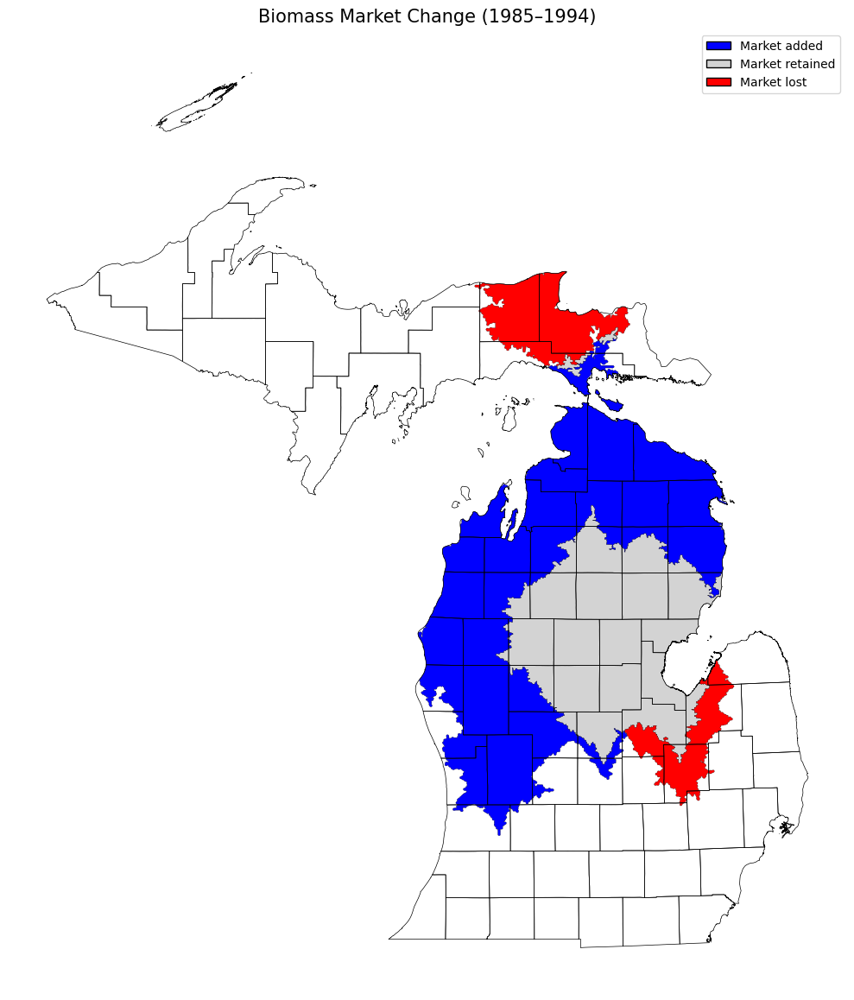

In [3]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (use Colab base_path) ---
change_fp   = os.path.join(base_path, "biomass_change_1985-1994.shp")
counties_fp = os.path.join(base_path, "Counties_(v17a).shp")

# --- Load ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by status ---
retain = gdf_change[gdf_change["status"] == "Market Retain"]
loss   = gdf_change[gdf_change["status"] == "Market Loss"]
add    = gdf_change[gdf_change["status"] == "Market Add"]

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Biomass Market Change (1985–1994)", fontsize=15)
ax.axis('off')
plt.tight_layout()
plt.show()


In [4]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Paths from your existing Colab base_path
raster_path    = os.path.join(base_path, "lulc2001.tif")
shapefile_path = os.path.join(base_path, "biomass_change_1985-1994.shp")  # <-- updated years

# ✅ Forest land cover class codes
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# ✅ Open raster
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # ✅ Open shapefile
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # ✅ Loop through features
        for feature in shp:
            polygon_label = feature["properties"].get("status", "unknown")  # 'status' column
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' has a forest area of {forest_area_acres:,.2f} acres.")


Polygon 'Market Retain' has a forest area of 2,285,243.15 acres.
Polygon 'Market Loss' has a forest area of 818,245.63 acres.
Polygon 'Market Add' has a forest area of 4,484,111.39 acres.


In [5]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "biomass_change_1985-1994.shp")  # <-- updated years

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 2853908.31 acres.
   White/Red/Jack Pine Group: 644542.50 acres
   Spruce/Fir Group: 187784.36 acres
   Oak/Hickory Group: 818.54 acres
   Elm/Ash/Cottonwood Group: 231.66 acres
   Maple/Beech/Birch Group: 92.66 acres
   Aspen/Birch Group: 2020438.59 acres

Polygon 'Market Loss' has a forest area of 1177563.43 acres.
   White/Red/Jack Pine Group: 247568.32 acres
   Spruce/Fir Group: 455692.51 acres
   Oak/Hickory Group: 216.22 acres
   Aspen/Birch Group: 474086.39 acres

Polygon 'Market Add' has a forest area of 5172494.52 acres.
   White/Red/Jack Pine Group: 1025562.97 acres
   Spruce/Fir Group: 562287.43 acres
   Oak/Hickory Group: 231.66 acres
   Elm/Ash/Cottonwood Group: 1328.19 acres
   Aspen/Birch Group: 3583084.28 acres



# 1994-2002

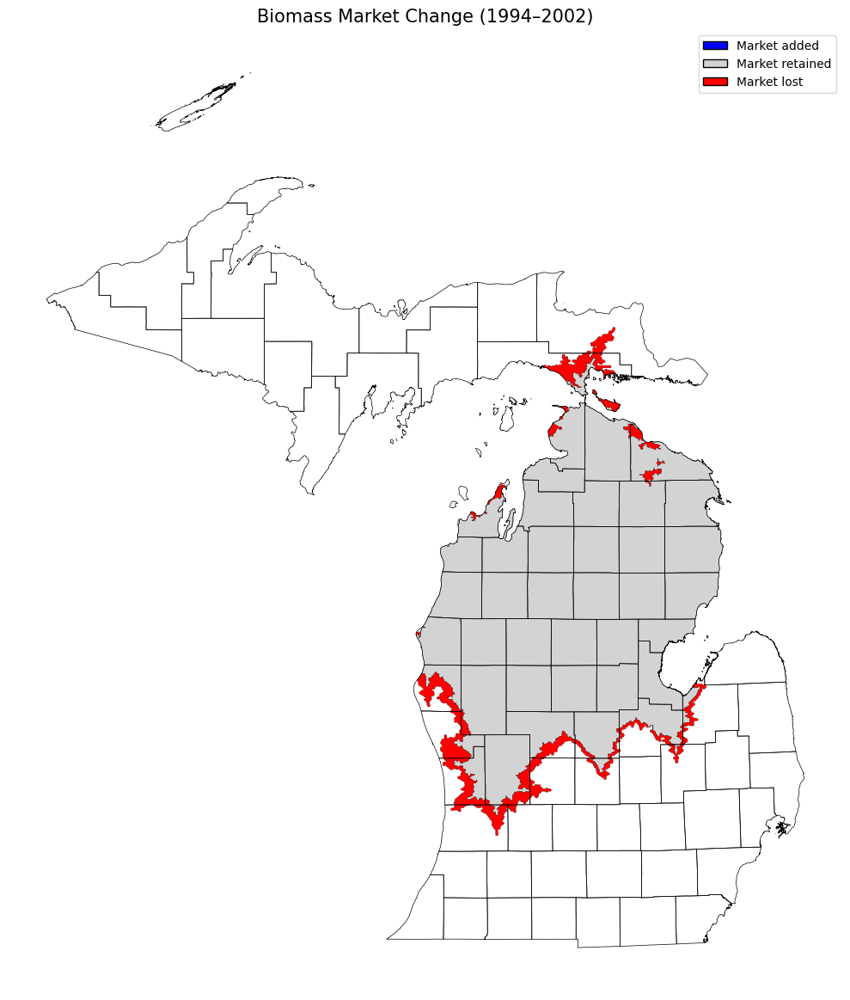

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (use Colab base_path) ---
change_fp   = os.path.join(base_path, "biomass_change_1994-2002.shp")  # <-- updated years
counties_fp = os.path.join(base_path, "Counties_(v17a).shp")

# --- Load ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by status ---
retain = gdf_change[gdf_change["status"] == "Market Retain"]
loss   = gdf_change[gdf_change["status"] == "Market Loss"]
add    = gdf_change[gdf_change["status"] == "Market Add"]

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Biomass Market Change (1994–2002)", fontsize=15)  # <-- updated title
ax.axis('off')
plt.tight_layout()
plt.show()


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Paths from your existing Colab base_path
raster_path    = os.path.join(base_path, "lulc2001.tif")
shapefile_path = os.path.join(base_path, "biomass_change_1994-2002.shp")  # <-- updated years

# ✅ Forest land cover class codes
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# ✅ Open raster
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # ✅ Open shapefile
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # ✅ Loop through features
        for feature in shp:
            polygon_label = feature["properties"].get("status", "unknown")  # 'status' column
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' has a forest area of {forest_area_acres:,.2f} acres.")


Polygon 'Market Retain' has a forest area of 6,384,712.80 acres.
Polygon 'Market Loss' has a forest area of 384,641.74 acres.
Polygon 'Market Add' has a forest area of 20.91 acres.


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "biomass_change_1994-2002.shp")  # <-- updated years

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 7579220.00 acres.
   White/Red/Jack Pine Group: 1633039.72 acres
   Spruce/Fir Group: 666210.52 acres
   Oak/Hickory Group: 942.09 acres
   Elm/Ash/Cottonwood Group: 1559.85 acres
   Maple/Beech/Birch Group: 92.66 acres
   Aspen/Birch Group: 5277375.15 acres

Polygon 'Market Loss' has a forest area of 447182.83 acres.
   White/Red/Jack Pine Group: 37065.75 acres
   Spruce/Fir Group: 83861.26 acres
   Oak/Hickory Group: 108.11 acres
   Aspen/Birch Group: 326147.71 acres

Polygon 'Market Add' has a forest area of 30.89 acres.
   Aspen/Birch Group: 30.89 acres



# 2002-2018

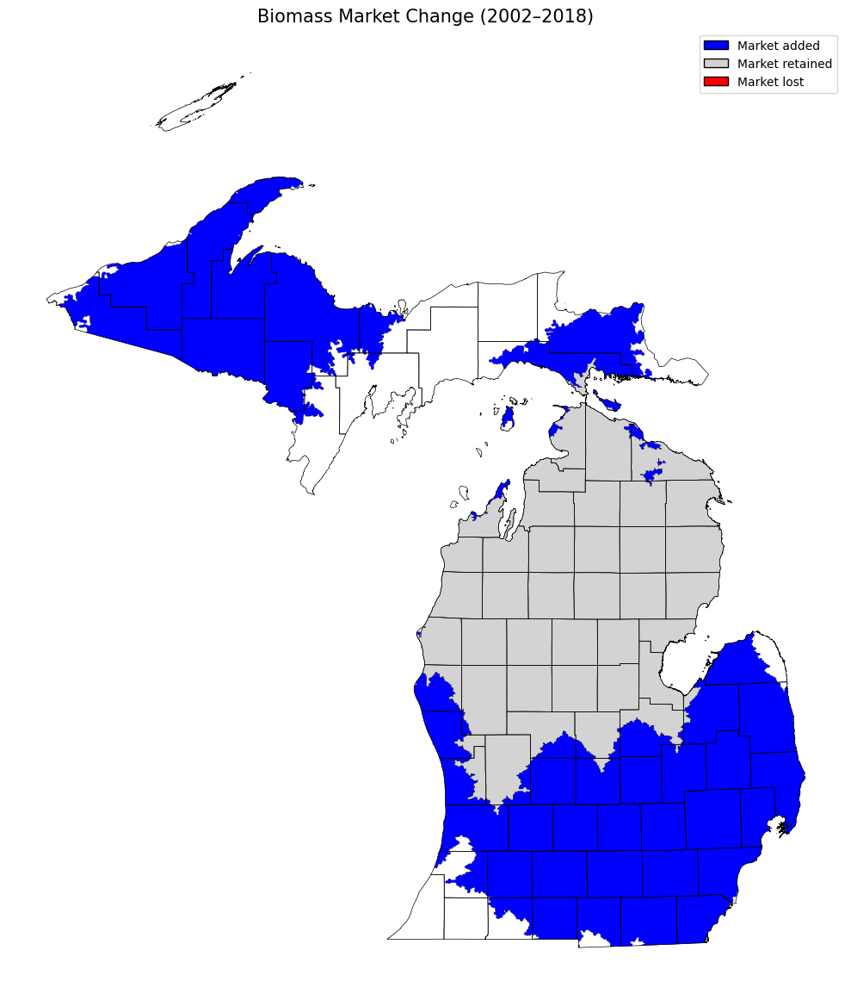

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (use Colab base_path) ---
change_fp   = os.path.join(base_path, "biomass_change_2002-2018.shp")  # <-- updated years
counties_fp = os.path.join(base_path, "Counties_(v17a).shp")

# --- Load ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by status ---
retain = gdf_change[gdf_change["status"] == "Market Retain"]
loss   = gdf_change[gdf_change["status"] == "Market Loss"]
add    = gdf_change[gdf_change["status"] == "Market Add"]

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Biomass Market Change (2002–2018)", fontsize=15)  # <-- updated title
ax.axis('off')
plt.tight_layout()
plt.show()


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Paths from your existing Colab base_path
raster_path    = os.path.join(base_path, "lulc2001.tif")
shapefile_path = os.path.join(base_path, "biomass_change_2002-2018.shp")  # <-- updated years

# ✅ Forest land cover class codes
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# ✅ Open raster
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # ✅ Open shapefile
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # ✅ Loop through features
        for feature in shp:
            polygon_label = feature["properties"].get("status", "unknown")  # 'status' column
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' has a forest area of {forest_area_acres:,.2f} acres.")


Polygon 'Market Retain' has a forest area of 6,384,161.26 acres.
Polygon 'Market Loss' has a forest area of 572.44 acres.
Polygon 'Market Add' has a forest area of 7,301,066.21 acres.


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "biomass_change_2002-2018.shp")  # <-- updated years

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 7579142.78 acres.
   White/Red/Jack Pine Group: 1632993.39 acres
   Spruce/Fir Group: 666179.64 acres
   Oak/Hickory Group: 942.09 acres
   Elm/Ash/Cottonwood Group: 1559.85 acres
   Maple/Beech/Birch Group: 92.66 acres
   Aspen/Birch Group: 5277375.15 acres

Polygon 'Market Loss' has a forest area of 108.11 acres.
   White/Red/Jack Pine Group: 46.33 acres
   Spruce/Fir Group: 30.89 acres
   Aspen/Birch Group: 30.89 acres

Polygon 'Market Add' has a forest area of 7769073.86 acres.
   White/Red/Jack Pine Group: 364726.98 acres
   Spruce/Fir Group: 1209100.21 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Hickory Group: 74672.04 acres
   Elm/Ash/Cottonwood Group: 100031.19 acres
   Maple/Beech/Birch Group: 3425616.62 acres
   Aspen/Birch Group: 2594787.83 acres



# 2018-2023

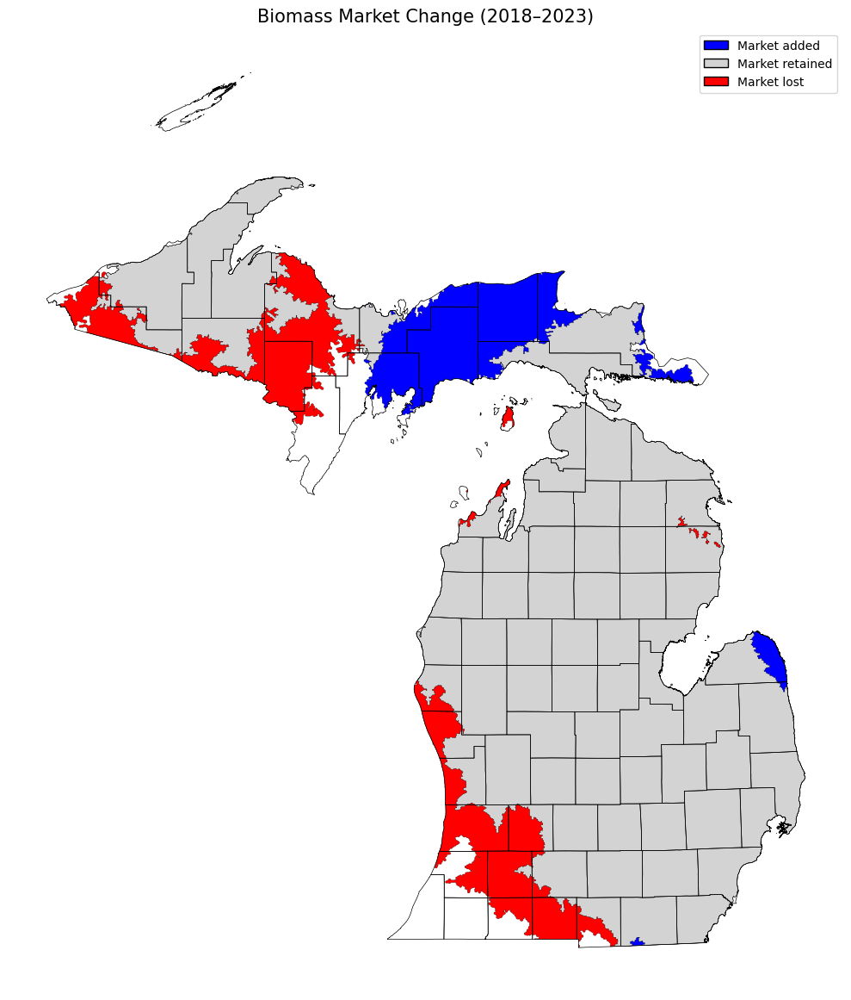

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (use Colab base_path) ---
change_fp   = os.path.join(base_path, "biomass_change_2018-2023.shp")  # <-- updated years
counties_fp = os.path.join(base_path, "Counties_(v17a).shp")

# --- Load ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by status ---
retain = gdf_change[gdf_change["status"] == "Market Retain"]
loss   = gdf_change[gdf_change["status"] == "Market Loss"]
add    = gdf_change[gdf_change["status"] == "Market Add"]

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Biomass Market Change (2018–2023)", fontsize=15)  # <-- updated title
ax.axis('off')
plt.tight_layout()
plt.show()


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Paths from your existing Colab base_path
raster_path    = os.path.join(base_path, "lulc2001.tif")
shapefile_path = os.path.join(base_path, "biomass_change_2018-2023.shp")  # <-- updated years

# ✅ Forest land cover class codes
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# ✅ Open raster
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # ✅ Open shapefile
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # ✅ Loop through features
        for feature in shp:
            polygon_label = feature["properties"].get("status", "unknown")  # 'status' column
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' has a forest area of {forest_area_acres:,.2f} acres.")


Polygon 'Market Retain' has a forest area of 11,715,354.85 acres.
Polygon 'Market Loss' has a forest area of 1,969,872.63 acres.
Polygon 'Market Add' has a forest area of 1,259,962.25 acres.


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "biomass_change_2018-2023.shp")  # <-- updated years

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 12872950.42 acres.
   White/Red/Jack Pine Group: 1844268.17 acres
   Spruce/Fir Group: 1429208.99 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Hickory Group: 25930.58 acres
   Elm/Ash/Cottonwood Group: 32494.31 acres
   Maple/Beech/Birch Group: 2366431.92 acres
   Aspen/Birch Group: 7174477.46 acres

Polygon 'Market Loss' has a forest area of 2475266.23 acres.
   White/Red/Jack Pine Group: 153452.21 acres
   Spruce/Fir Group: 446070.86 acres
   Oak/Hickory Group: 49683.55 acres
   Elm/Ash/Cottonwood Group: 69096.74 acres
   Maple/Beech/Birch Group: 1059277.36 acres
   Aspen/Birch Group: 697685.52 acres

Polygon 'Market Add' has a forest area of 2246338.89 acres.
   White/Red/Jack Pine Group: 414317.86 acres
   Spruce/Fir Group: 916651.44 acres
   Oak/Hickory Group: 5034.76 acres
   Elm/Ash/Cottonwood Group: 8355.24 acres
   Maple/Beech/Birch Group: 216124.21 acres
   Aspen/Birch Group: 685855.37 acres



# 1985-2023

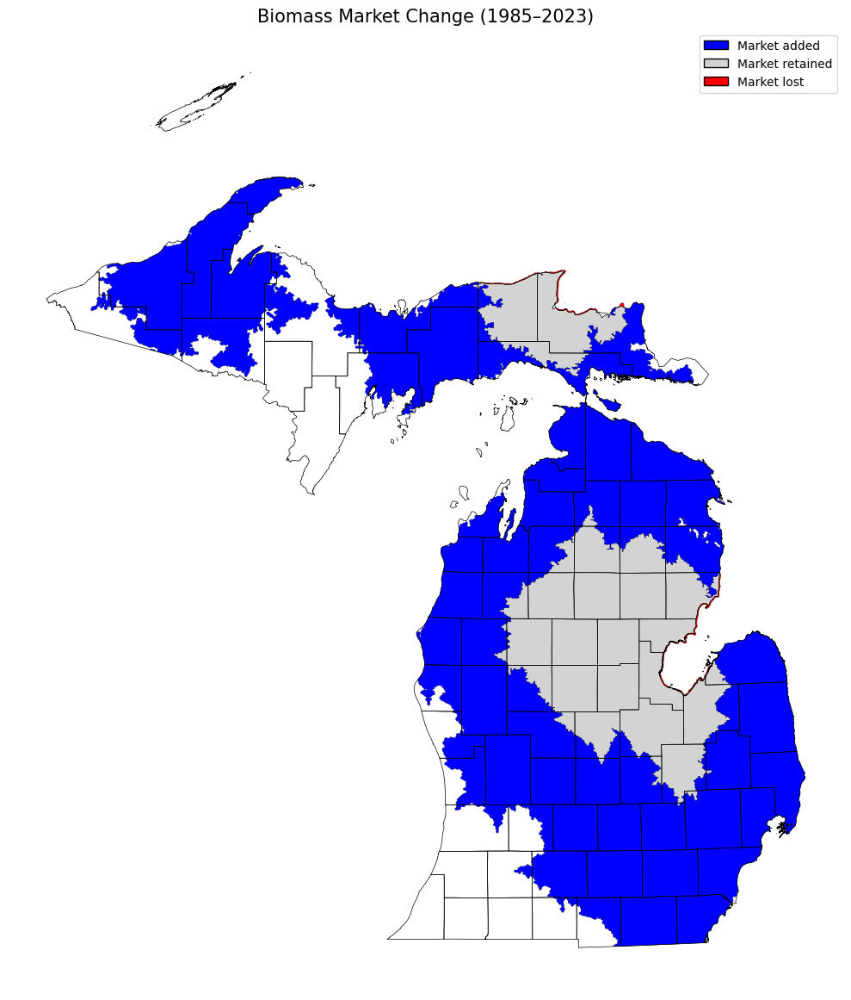

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (use Colab base_path) ---
change_fp   = os.path.join(base_path, "biomass_change_1985-2023.shp")  # <-- updated years
counties_fp = os.path.join(base_path, "Counties_(v17a).shp")

# --- Load ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by status ---
retain = gdf_change[gdf_change["status"] == "Market Retain"]
loss   = gdf_change[gdf_change["status"] == "Market Loss"]
add    = gdf_change[gdf_change["status"] == "Market Add"]

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Biomass Market Change (1985–2023)", fontsize=15)  # <-- updated title
ax.axis('off')
plt.tight_layout()
plt.show()


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Paths from your existing Colab base_path
raster_path    = os.path.join(base_path, "lulc2001.tif")
shapefile_path = os.path.join(base_path, "biomass_change_1985-2023.shp")  # <-- updated years

# ✅ Forest land cover class codes
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# ✅ Open raster
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # ✅ Open shapefile
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # ✅ Loop through features
        for feature in shp:
            polygon_label = feature["properties"].get("status", "unknown")  # 'status' column
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' has a forest area of {forest_area_acres:,.2f} acres.")


Polygon 'Market Retain' has a forest area of 3,103,479.89 acres.
Polygon 'Market Loss' has a forest area of 8.90 acres.
Polygon 'Market Add' has a forest area of 9,871,837.21 acres.


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "biomass_change_1985-2023.shp")  # <-- updated years

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 4031456.30 acres.
   White/Red/Jack Pine Group: 892110.83 acres
   Spruce/Fir Group: 643476.86 acres
   Oak/Hickory Group: 1034.75 acres
   Elm/Ash/Cottonwood Group: 231.66 acres
   Maple/Beech/Birch Group: 92.66 acres
   Aspen/Birch Group: 2494509.53 acres

Polygon 'Market Loss' has a forest area of 15.44 acres.
   Aspen/Birch Group: 15.44 acres

Polygon 'Market Add' has a forest area of 11087833.01 acres.
   White/Red/Jack Pine Group: 1366475.21 acres
   Spruce/Fir Group: 1702383.57 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Hickory Group: 29930.59 acres
   Elm/Ash/Cottonwood Group: 40617.88 acres
   Maple/Beech/Birch Group: 2582463.47 acres
   Aspen/Birch Group: 5365823.30 acres



# 1994-2023

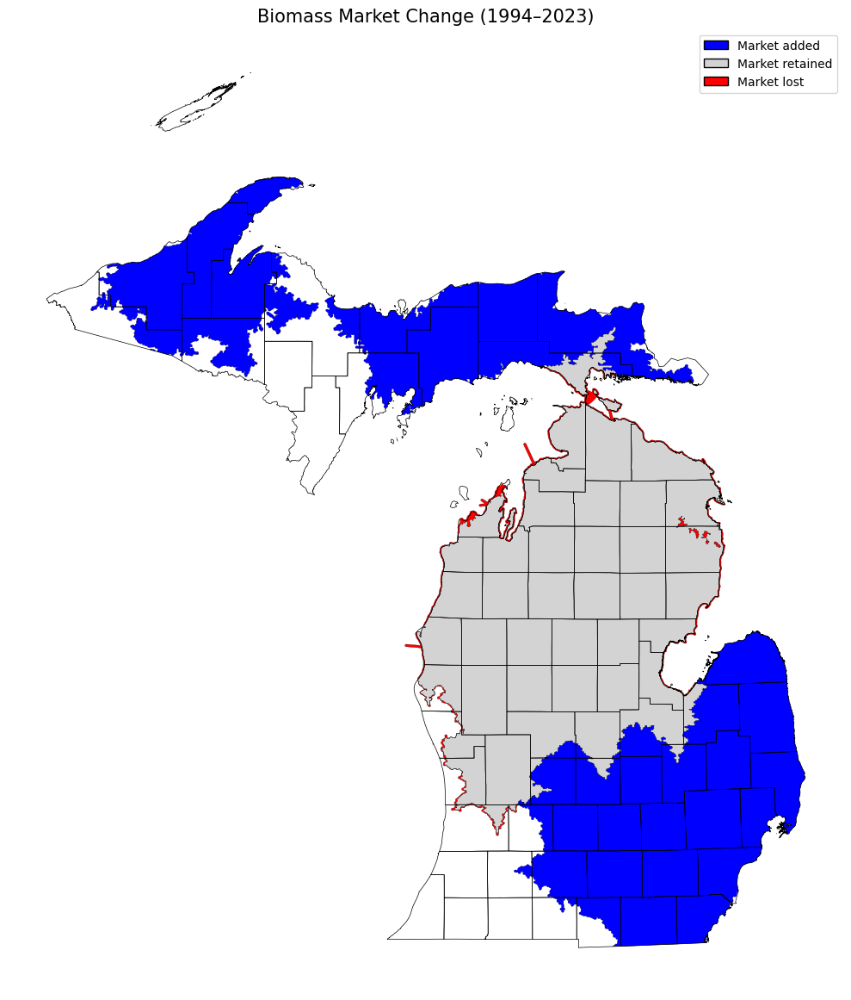

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (use Colab base_path) ---
change_fp   = os.path.join(base_path, "biomass_change_1994-2023.shp")  # <-- updated years
counties_fp = os.path.join(base_path, "Counties_(v17a).shp")

# --- Load ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by status ---
retain = gdf_change[gdf_change["status"] == "Market Retain"]
loss   = gdf_change[gdf_change["status"] == "Market Loss"]
add    = gdf_change[gdf_change["status"] == "Market Add"]

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Biomass Market Change (1994–2023)", fontsize=15)  # <-- updated title
ax.axis('off')
plt.tight_layout()
plt.show()


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Paths from your existing Colab base_path
raster_path    = os.path.join(base_path, "lulc2001.tif")
shapefile_path = os.path.join(base_path, "biomass_change_1994-2023.shp")  # <-- updated years

# ✅ Forest land cover class codes
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# ✅ Open raster
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # ✅ Open shapefile
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # ✅ Loop through features
        for feature in shp:
            polygon_label = feature["properties"].get("status", "unknown")  # 'status' column
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' has a forest area of {forest_area_acres:,.2f} acres.")


Polygon 'Market Retain' has a forest area of 6,729,615.76 acres.
Polygon 'Market Loss' has a forest area of 39,738.78 acres.
Polygon 'Market Add' has a forest area of 6,245,701.34 acres.


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "biomass_change_1994-2023.shp")  # <-- updated years

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 7984101.55 acres.
   White/Red/Jack Pine Group: 1664839.05 acres
   Spruce/Fir Group: 746504.21 acres
   Oak/Hickory Group: 1050.20 acres
   Elm/Ash/Cottonwood Group: 1559.85 acres
   Maple/Beech/Birch Group: 92.66 acres
   Aspen/Birch Group: 5570055.58 acres

Polygon 'Market Loss' has a forest area of 42301.29 acres.
   White/Red/Jack Pine Group: 5266.43 acres
   Spruce/Fir Group: 3567.58 acres
   Aspen/Birch Group: 33467.28 acres

Polygon 'Market Add' has a forest area of 7135187.76 acres.
   White/Red/Jack Pine Group: 593746.98 acres
   Spruce/Fir Group: 1599356.22 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Hickory Group: 29915.15 acres
   Elm/Ash/Cottonwood Group: 39289.69 acres
   Maple/Beech/Birch Group: 2582463.47 acres
   Aspen/Birch Group: 2290277.25 acres



# 2002-2023

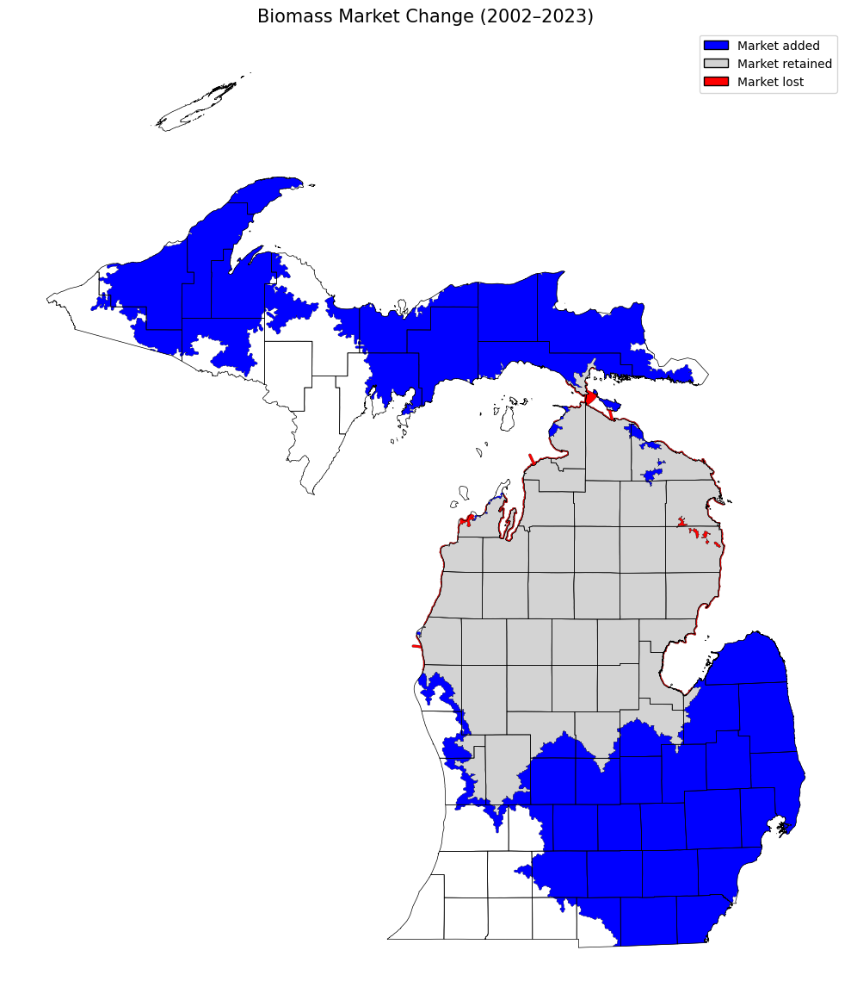

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (use Colab base_path) ---
change_fp   = os.path.join(base_path, "biomass_change_2002-2023.shp")  # <-- updated years
counties_fp = os.path.join(base_path, "Counties_(v17a).shp")

# --- Load ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by status ---
retain = gdf_change[gdf_change["status"] == "Market Retain"]
loss   = gdf_change[gdf_change["status"] == "Market Loss"]
add    = gdf_change[gdf_change["status"] == "Market Add"]

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Biomass Market Change (2002–2023)", fontsize=15)  # <-- updated title
ax.axis('off')
plt.tight_layout()
plt.show()


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Paths from your existing Colab base_path
raster_path    = os.path.join(base_path, "lulc2001.tif")
shapefile_path = os.path.join(base_path, "biomass_change_2002-2023.shp")  # <-- updated years

# ✅ Forest land cover class codes
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# ✅ Open raster
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # ✅ Open shapefile
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # ✅ Loop through features
        for feature in shp:
            polygon_label = feature["properties"].get("status", "unknown")  # 'status' column
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' has a forest area of {forest_area_acres:,.2f} acres.")


Polygon 'Market Retain' has a forest area of 6,370,258.05 acres.
Polygon 'Market Loss' has a forest area of 14,475.66 acres.
Polygon 'Market Add' has a forest area of 6,605,059.05 acres.


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "biomass_change_2002-2023.shp")  # <-- updated years

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 7559158.17 acres.
   White/Red/Jack Pine Group: 1631943.20 acres
   Spruce/Fir Group: 663754.92 acres
   Oak/Hickory Group: 942.09 acres
   Elm/Ash/Cottonwood Group: 1559.85 acres
   Maple/Beech/Birch Group: 92.66 acres
   Aspen/Birch Group: 5260865.45 acres

Polygon 'Market Loss' has a forest area of 20092.73 acres.
   White/Red/Jack Pine Group: 1096.53 acres
   Spruce/Fir Group: 2455.61 acres
   Aspen/Birch Group: 16540.59 acres

Polygon 'Market Add' has a forest area of 7560131.14 acres.
   White/Red/Jack Pine Group: 626642.84 acres
   Spruce/Fir Group: 1682105.51 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Hickory Group: 30023.26 acres
   Elm/Ash/Cottonwood Group: 39289.69 acres
   Maple/Beech/Birch Group: 2582463.47 acres
   Aspen/Birch Group: 2599467.38 acres



# Pulpwood

# 1985-1994

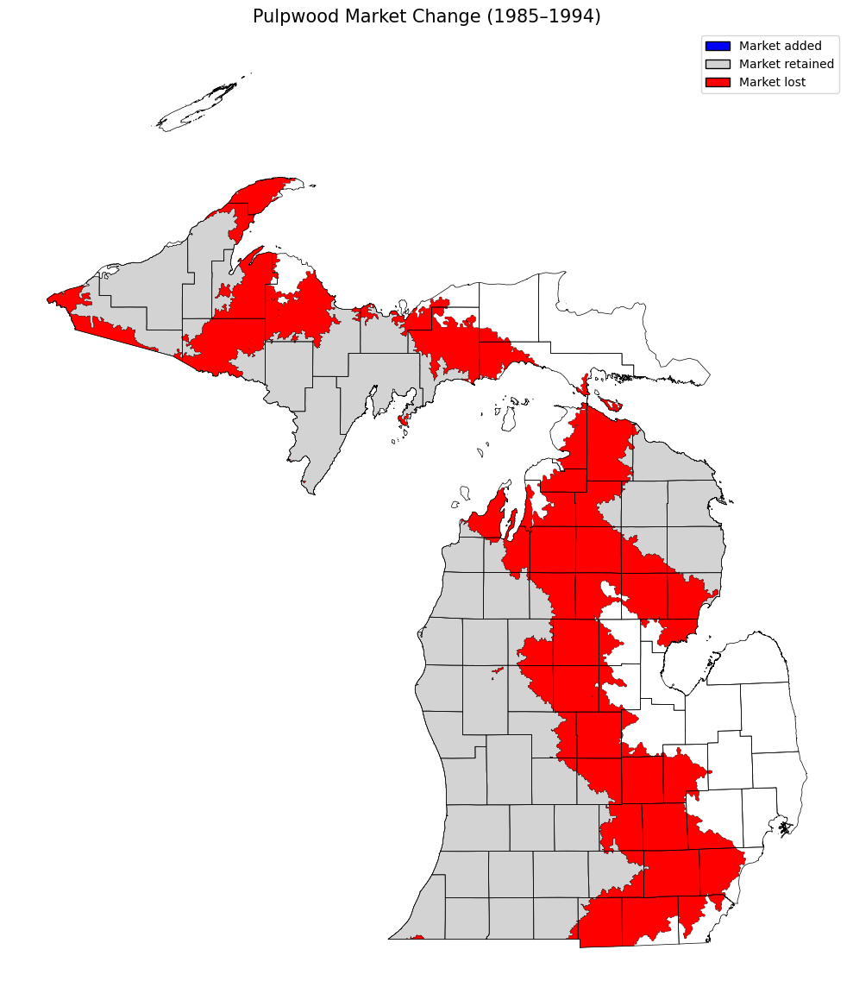

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (use Colab base_path) ---
change_fp   = os.path.join(base_path, "pulpwood_change_1985-1994.shp")  # <-- updated to pulpwood
counties_fp = os.path.join(base_path, "Counties_(v17a).shp")

# --- Load ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by status ---
retain = gdf_change[gdf_change["status"] == "Market Retain"]
loss   = gdf_change[gdf_change["status"] == "Market Loss"]
add    = gdf_change[gdf_change["status"] == "Market Add"]

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Pulpwood Market Change (1985–1994)", fontsize=15)  # <-- updated title
ax.axis('off')
plt.tight_layout()
plt.show()


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Paths from your existing Colab base_path
raster_path    = os.path.join(base_path, "lulc2001.tif")
shapefile_path = os.path.join(base_path, "pulpwood_change_1985-1994.shp")  # <-- switched to pulpwood 1985–1994

# ✅ Forest land cover class codes
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# ✅ Open raster
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # ✅ Open shapefile
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # ✅ Loop through features
        for feature in shp:
            polygon_label = feature["properties"].get("status", "unknown")  # 'status' column
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' has a forest area of {forest_area_acres:,.2f} acres.")


Polygon 'Market Retain' has a forest area of 7,468,983.84 acres.
Polygon 'Market Loss' has a forest area of 5,473,092.39 acres.
Polygon 'Market Add' has a forest area of 501.72 acres.


In [6]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "pulpwood_change_1985-1994.shp")  # <-- updated for pulpwood 1985–1994

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 9213140.04 acres.
   White/Red/Jack Pine Group: 1090906.80 acres
   Spruce/Fir Group: 1388143.23 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Pine Group: 30.89 acres
   Oak/Hickory Group: 122008.09 acres
   Elm/Ash/Cottonwood Group: 161529.45 acres
   Maple/Beech/Birch Group: 2532208.49 acres
   Aspen/Birch Group: 3918174.10 acres

Polygon 'Market Loss' has a forest area of 6337084.95 acres.
   White/Red/Jack Pine Group: 937068.49 acres
   Spruce/Fir Group: 1012234.74 acres
   Oak/Hickory Group: 25251.04 acres
   Elm/Ash/Cottonwood Group: 17390.01 acres
   Maple/Beech/Birch Group: 1311401.68 acres
   Aspen/Birch Group: 3033738.97 acres

Polygon 'Market Add' has a forest area of 247.11 acres.
   White/Red/Jack Pine Group: 46.33 acres
   Spruce/Fir Group: 46.33 acres
   Oak/Hickory Group: 15.44 acres
   Maple/Beech/Birch Group: 92.66 acres
   Aspen/Birch Group: 46.33 acres



# 1994-2002

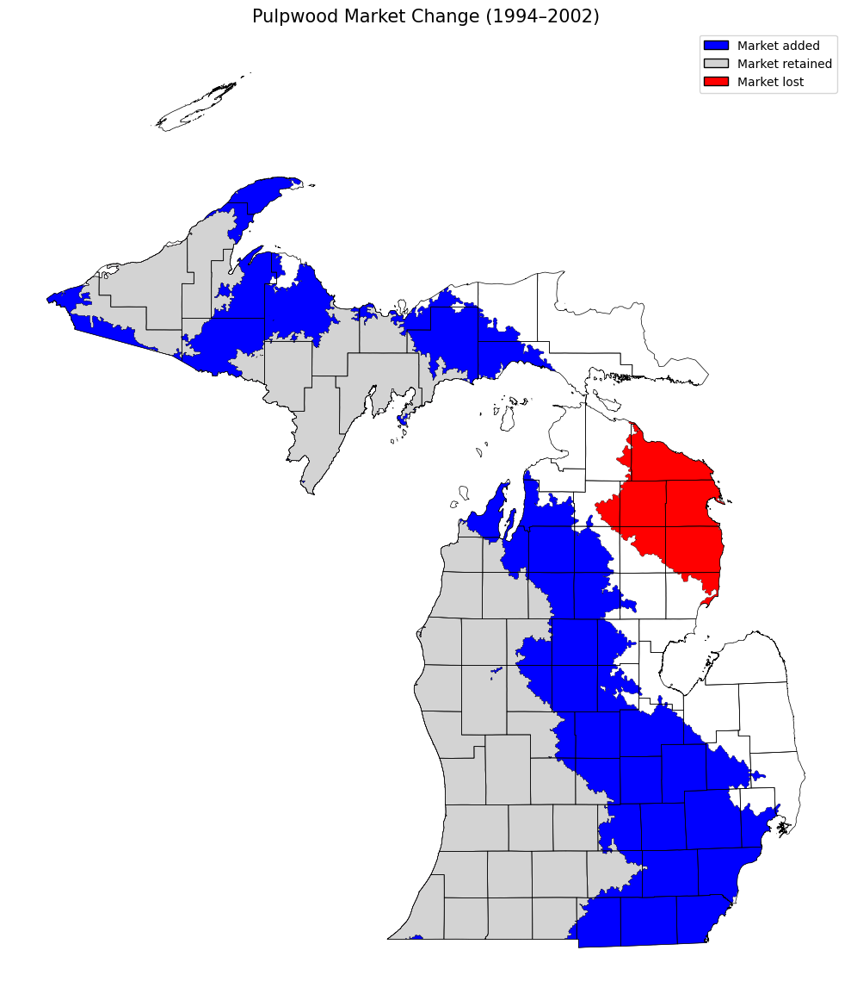

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (use Colab base_path) ---
change_fp   = os.path.join(base_path, "pulpwood_change_1994-2002.shp")  # <-- updated to pulpwood 1994–2002
counties_fp = os.path.join(base_path, "Counties_(v17a).shp")

# --- Load ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by status ---
retain = gdf_change[gdf_change["status"] == "Market Retain"]
loss   = gdf_change[gdf_change["status"] == "Market Loss"]
add    = gdf_change[gdf_change["status"] == "Market Add"]

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Pulpwood Market Change (1994–2002)", fontsize=15)  # <-- updated title
ax.axis('off')
plt.tight_layout()
plt.show()


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Paths from your existing Colab base_path
raster_path    = os.path.join(base_path, "lulc2001.tif")
shapefile_path = os.path.join(base_path, "pulpwood_change_1994-2002.shp")  # <-- switched to pulpwood 1994–2002

# ✅ Forest land cover class codes
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# ✅ Open raster
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # ✅ Open shapefile
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # ✅ Loop through features
        for feature in shp:
            polygon_label = feature["properties"].get("status", "unknown")  # 'status' column
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' has a forest area of {forest_area_acres:,.2f} acres.")


Polygon 'Market Retain' has a forest area of 6,424,763.16 acres.
Polygon 'Market Loss' has a forest area of 1,044,722.40 acres.
Polygon 'Market Add' has a forest area of 4,945,089.60 acres.


In [7]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "pulpwood_change_1994-2002.shp")  # <-- updated for pulpwood 1994–2002

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 7669876.65 acres.
   White/Red/Jack Pine Group: 848141.58 acres
   Spruce/Fir Group: 1132930.09 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Pine Group: 30.89 acres
   Oak/Hickory Group: 122008.09 acres
   Elm/Ash/Cottonwood Group: 161529.45 acres
   Maple/Beech/Birch Group: 2532162.16 acres
   Aspen/Birch Group: 2872935.39 acres

Polygon 'Market Loss' has a forest area of 1543510.49 acres.
   White/Red/Jack Pine Group: 242811.55 acres
   Spruce/Fir Group: 255259.47 acres
   Oak/Hickory Group: 15.44 acres
   Maple/Beech/Birch Group: 139.00 acres
   Aspen/Birch Group: 1045285.04 acres

Polygon 'Market Add' has a forest area of 5479028.28 acres.
   White/Red/Jack Pine Group: 638225.88 acres
   Spruce/Fir Group: 892805.81 acres
   Oak/Hickory Group: 31552.22 acres
   Elm/Ash/Cottonwood Group: 17343.68 acres
   Maple/Beech/Birch Group: 1394073.75 acres
   Aspen/Birch Group: 2505026.94 acres



# 2002-2018

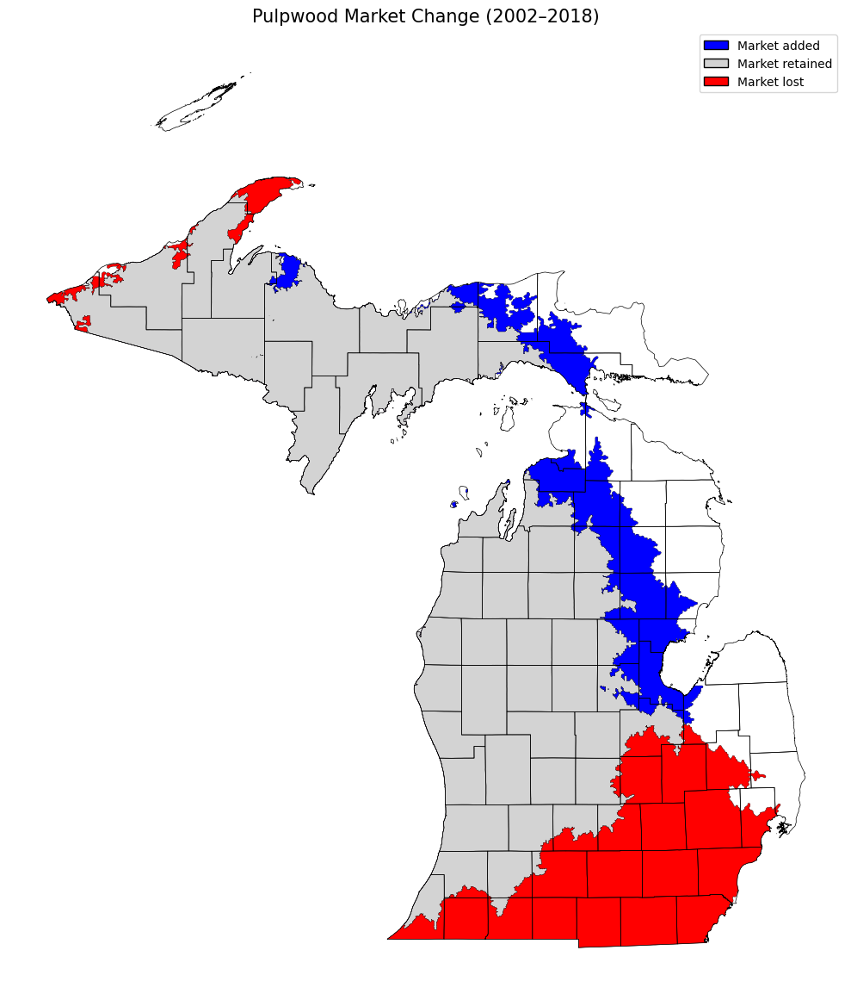

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (use Colab base_path) ---
change_fp   = os.path.join(base_path, "pulpwood_change_2002-2018.shp")  # <-- updated to pulpwood 2002–2018
counties_fp = os.path.join(base_path, "Counties_(v17a).shp")

# --- Load ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by status ---
retain = gdf_change[gdf_change["status"] == "Market Retain"]
loss   = gdf_change[gdf_change["status"] == "Market Loss"]
add    = gdf_change[gdf_change["status"] == "Market Add"]

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Pulpwood Market Change (2002–2018)", fontsize=15)  # <-- updated title
ax.axis('off')
plt.tight_layout()
plt.show()


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Paths from your existing Colab base_path
raster_path    = os.path.join(base_path, "lulc2001.tif")
shapefile_path = os.path.join(base_path, "pulpwood_change_2002-2018.shp")  # <-- switched to pulpwood 2002–2018

# ✅ Forest land cover class codes
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# ✅ Open raster
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # ✅ Open shapefile
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # ✅ Loop through features
        for feature in shp:
            polygon_label = feature["properties"].get("status", "unknown")  # 'status' column
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' has a forest area of {forest_area_acres:,.2f} acres.")


Polygon 'Market Retain' has a forest area of 9,535,047.21 acres.
Polygon 'Market Loss' has a forest area of 1,834,805.55 acres.
Polygon 'Market Add' has a forest area of 1,753,854.62 acres.


In [8]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "pulpwood_change_2002-2018.shp")  # <-- updated for pulpwood 2002–2018

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 11998322.27 acres.
   White/Red/Jack Pine Group: 1479479.41 acres
   Spruce/Fir Group: 2005257.08 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Pine Group: 30.89 acres
   Oak/Hickory Group: 49668.11 acres
   Elm/Ash/Cottonwood Group: 99289.88 acres
   Maple/Beech/Birch Group: 3576721.32 acres
   Aspen/Birch Group: 4787736.60 acres

Polygon 'Market Loss' has a forest area of 1150582.66 acres.
   White/Red/Jack Pine Group: 6888.05 acres
   Spruce/Fir Group: 20478.83 acres
   Oak/Hickory Group: 103892.21 acres
   Elm/Ash/Cottonwood Group: 79583.25 acres
   Maple/Beech/Birch Group: 349514.58 acres
   Aspen/Birch Group: 590225.74 acres

Polygon 'Market Add' has a forest area of 2399837.43 acres.
   White/Red/Jack Pine Group: 452480.14 acres
   Spruce/Fir Group: 494472.55 acres
   Oak/Hickory Group: 401.55 acres
   Elm/Ash/Cottonwood Group: 679.54 acres
   Maple/Beech/Birch Group: 78996.38 acres
   Aspen/Birch Group: 1372807.27 acres



# 2018-2023

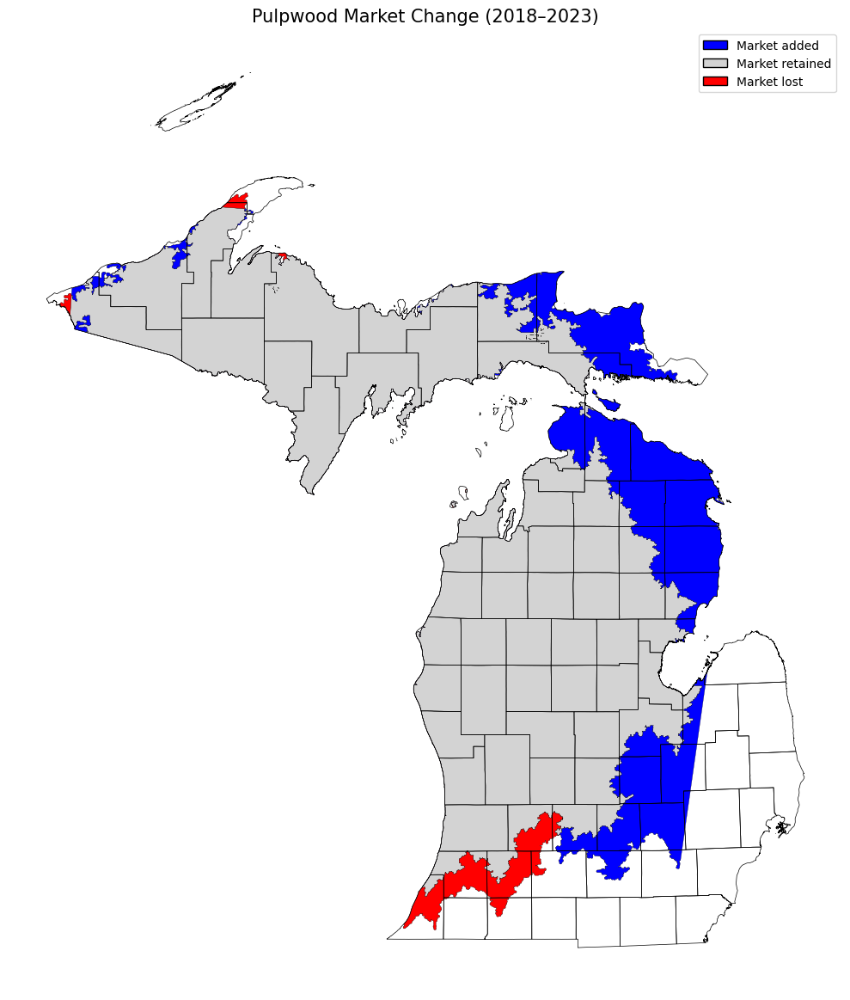

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (use Colab base_path) ---
change_fp   = os.path.join(base_path, "pulpwood_change_2018-2023.shp")  # <-- updated to pulpwood 2018–2023
counties_fp = os.path.join(base_path, "Counties_(v17a).shp")

# --- Load ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by status ---
retain = gdf_change[gdf_change["status"] == "Market Retain"]
loss   = gdf_change[gdf_change["status"] == "Market Loss"]
add    = gdf_change[gdf_change["status"] == "Market Add"]

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Pulpwood Market Change (2018–2023)", fontsize=15)  # <-- updated title
ax.axis('off')
plt.tight_layout()
plt.show()


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Paths from your existing Colab base_path
raster_path    = os.path.join(base_path, "lulc2001.tif")
shapefile_path = os.path.join(base_path, "pulpwood_change_2018-2023.shp")  # <-- switched to pulpwood 2018–2023

# ✅ Forest land cover class codes
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# ✅ Open raster
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # ✅ Open shapefile
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # ✅ Loop through features
        for feature in shp:
            polygon_label = feature["properties"].get("status", "unknown")  # 'status' column
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' has a forest area of {forest_area_acres:,.2f} acres.")


Polygon 'Market Retain' has a forest area of 11,023,882.31 acres.
Polygon 'Market Loss' has a forest area of 265,019.74 acres.
Polygon 'Market Add' has a forest area of 2,481,733.36 acres.


In [9]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "pulpwood_change_2018-2023.shp")  # <-- updated for pulpwood 2018–2023

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 14172475.61 acres.
   White/Red/Jack Pine Group: 1929426.73 acres
   Spruce/Fir Group: 2498540.43 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Hickory Group: 24973.05 acres
   Elm/Ash/Cottonwood Group: 68556.19 acres
   Maple/Beech/Birch Group: 3580211.68 acres
   Aspen/Birch Group: 6070628.54 acres

Polygon 'Market Loss' has a forest area of 225684.09 acres.
   White/Red/Jack Pine Group: 2532.83 acres
   Spruce/Fir Group: 1189.19 acres
   Oak/Pine Group: 30.89 acres
   Oak/Hickory Group: 25096.60 acres
   Elm/Ash/Cottonwood Group: 31413.22 acres
   Maple/Beech/Birch Group: 75506.02 acres
   Aspen/Birch Group: 89915.33 acres

Polygon 'Market Add' has a forest area of 3149554.00 acres.
   White/Red/Jack Pine Group: 478055.51 acres
   Spruce/Fir Group: 654627.48 acres
   Oak/Hickory Group: 308.88 acres
   Elm/Ash/Cottonwood Group: 277.99 acres
   Maple/Beech/Birch Group: 128340.16 acres
   Aspen/Birch Group: 1887943.98 acres



# 1985-2023

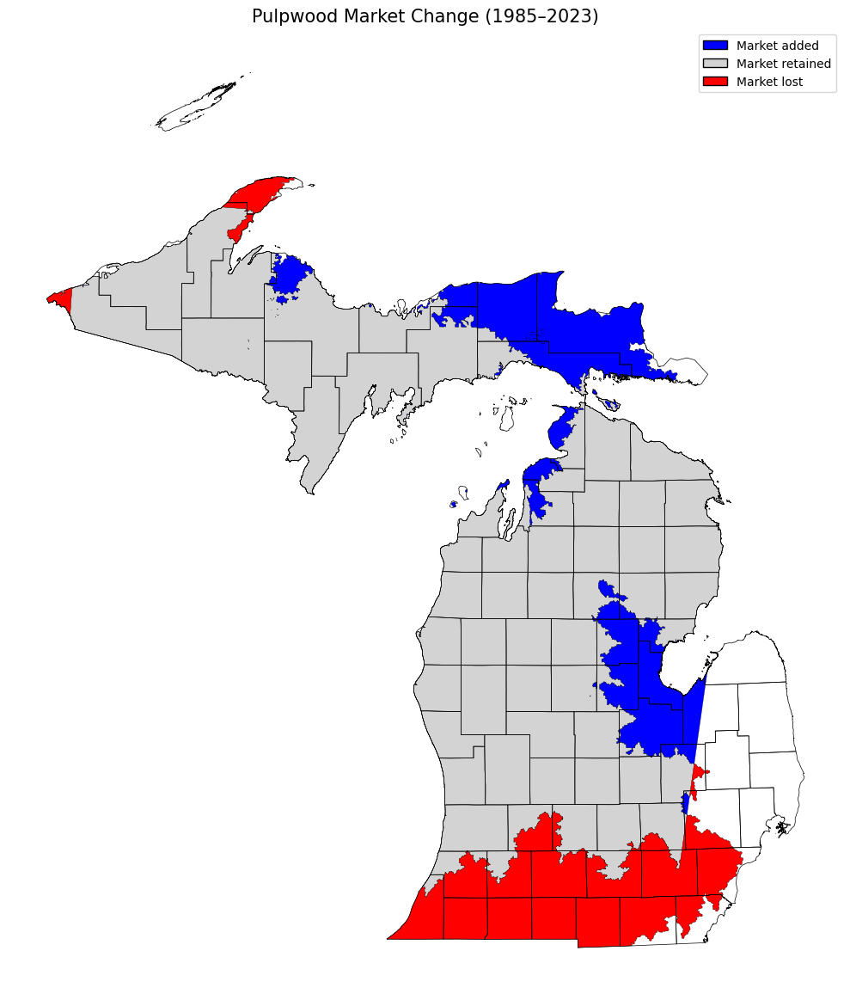

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (use Colab base_path) ---
change_fp   = os.path.join(base_path, "pulpwood_change_1985-2023.shp")  # <-- updated to pulpwood 1985–2023
counties_fp = os.path.join(base_path, "Counties_(v17a).shp")

# --- Load ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by status ---
retain = gdf_change[gdf_change["status"] == "Market Retain"]
loss   = gdf_change[gdf_change["status"] == "Market Loss"]
add    = gdf_change[gdf_change["status"] == "Market Add"]

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Pulpwood Market Change (1985–2023)", fontsize=15)  # <-- updated title
ax.axis('off')
plt.tight_layout()
plt.show()


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Paths from your existing Colab base_path
raster_path    = os.path.join(base_path, "lulc2001.tif")
shapefile_path = os.path.join(base_path, "pulpwood_change_1985-2023.shp")  # <-- switched to pulpwood 1985–2023

# ✅ Forest land cover class codes
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# ✅ Open raster
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # ✅ Open shapefile
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # ✅ Loop through features
        for feature in shp:
            polygon_label = feature["properties"].get("status", "unknown")  # 'status' column
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' has a forest area of {forest_area_acres:,.2f} acres.")


Polygon 'Market Retain' has a forest area of 11,700,799.35 acres.
Polygon 'Market Loss' has a forest area of 1,241,276.89 acres.
Polygon 'Market Add' has a forest area of 1,805,653.86 acres.


In [10]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "pulpwood_change_1985-2023.shp")  # <-- updated for pulpwood 1985–2023

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 14641187.47 acres.
   White/Red/Jack Pine Group: 2021890.33 acres
   Spruce/Fir Group: 2384007.26 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Hickory Group: 24046.41 acres
   Elm/Ash/Cottonwood Group: 68386.31 acres
   Maple/Beech/Birch Group: 3565647.93 acres
   Aspen/Birch Group: 6577070.23 acres

Polygon 'Market Loss' has a forest area of 909037.52 acres.
   White/Red/Jack Pine Group: 6084.96 acres
   Spruce/Fir Group: 16370.71 acres
   Oak/Pine Group: 30.89 acres
   Oak/Hickory Group: 123212.73 acres
   Elm/Ash/Cottonwood Group: 110533.16 acres
   Maple/Beech/Birch Group: 277962.24 acres
   Aspen/Birch Group: 374842.84 acres

Polygon 'Market Add' has a forest area of 2681151.03 acres.
   White/Red/Jack Pine Group: 385591.91 acres
   Spruce/Fir Group: 769160.64 acres
   Oak/Hickory Group: 1235.53 acres
   Elm/Ash/Cottonwood Group: 447.88 acres
   Maple/Beech/Birch Group: 142903.91 acres
   Aspen/Birch Group: 1381811.16 acres



# 1994-2023

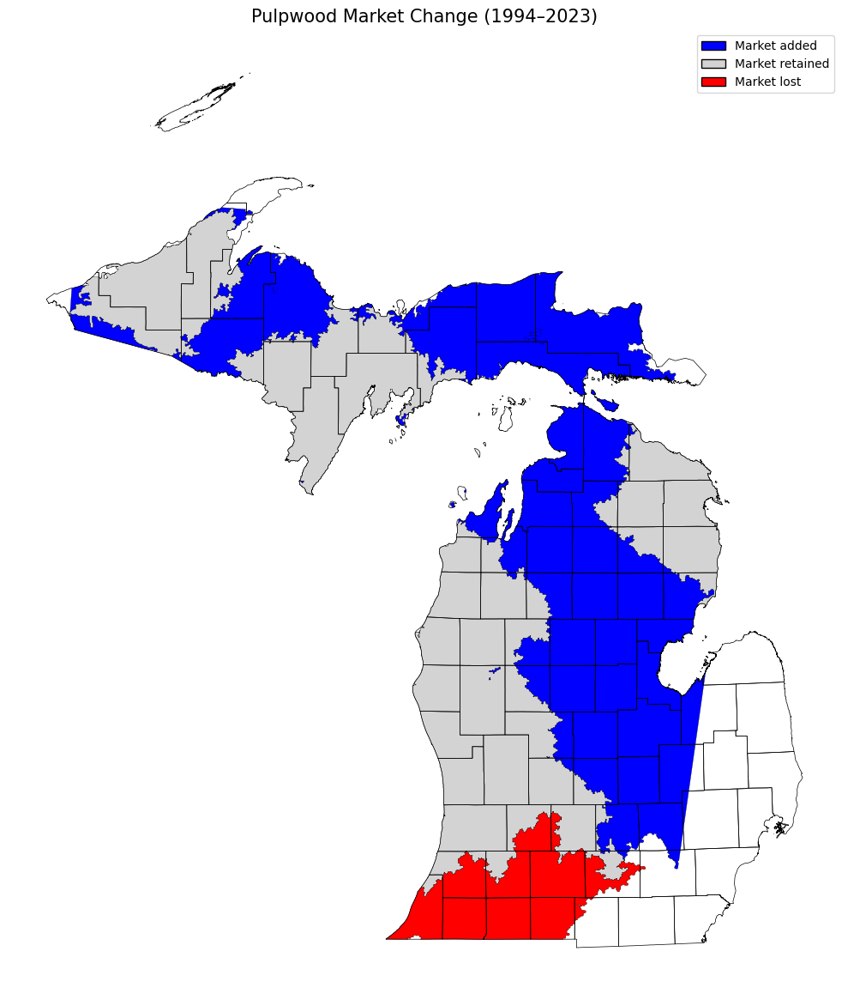

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (use Colab base_path) ---
change_fp   = os.path.join(base_path, "pulpwood_change_1994-2023.shp")  # <-- updated to pulpwood 1994–2023
counties_fp = os.path.join(base_path, "Counties_(v17a).shp")

# --- Load ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by status ---
retain = gdf_change[gdf_change["status"] == "Market Retain"]
loss   = gdf_change[gdf_change["status"] == "Market Loss"]
add    = gdf_change[gdf_change["status"] == "Market Add"]

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Pulpwood Market Change (1994–2023)", fontsize=15)  # <-- updated title
ax.axis('off')
plt.tight_layout()
plt.show()


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Paths from your existing Colab base_path
raster_path    = os.path.join(base_path, "lulc2001.tif")
shapefile_path = os.path.join(base_path, "pulpwood_change_1994-2023.shp")  # <-- switched to pulpwood 1994–2023

# ✅ Forest land cover class codes
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# ✅ Open raster
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # ✅ Open shapefile
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # ✅ Loop through features
        for feature in shp:
            polygon_label = feature["properties"].get("status", "unknown")  # 'status' column
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' has a forest area of {forest_area_acres:,.2f} acres.")


Polygon 'Market Retain' has a forest area of 6,923,907.82 acres.
Polygon 'Market Loss' has a forest area of 545,577.74 acres.
Polygon 'Market Add' has a forest area of 6,581,703.62 acres.


In [11]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "pulpwood_change_1994-2023.shp")  # <-- updated for pulpwood 1994–2023

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 8760088.47 acres.
   White/Red/Jack Pine Group: 1087864.32 acres
   Spruce/Fir Group: 1388174.11 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Hickory Group: 19737.51 acres
   Elm/Ash/Cottonwood Group: 59428.75 acres
   Maple/Beech/Birch Group: 2483698.69 acres
   Aspen/Birch Group: 3721046.09 acres

Polygon 'Market Loss' has a forest area of 453298.68 acres.
   White/Red/Jack Pine Group: 3088.81 acres
   Spruce/Fir Group: 15.44 acres
   Oak/Pine Group: 30.89 acres
   Oak/Hickory Group: 102286.03 acres
   Elm/Ash/Cottonwood Group: 102100.70 acres
   Maple/Beech/Birch Group: 48602.46 acres
   Aspen/Birch Group: 197174.35 acres

Polygon 'Market Add' has a forest area of 8561941.14 acres.
   White/Red/Jack Pine Group: 1319617.92 acres
   Spruce/Fir Group: 1764993.79 acres
   Oak/Hickory Group: 5544.42 acres
   Elm/Ash/Cottonwood Group: 9405.43 acres
   Maple/Beech/Birch Group: 1224853.15 acres
   Aspen/Birch Group: 4237526.42 acres



# 2002-2023

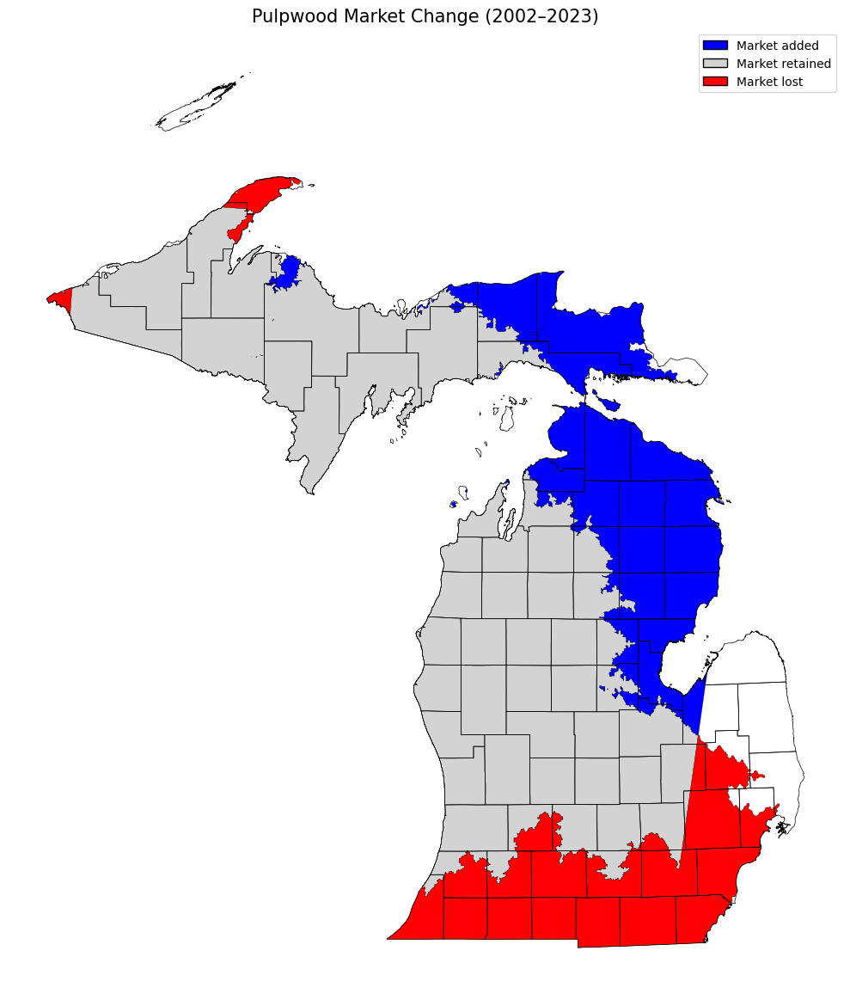

In [12]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (use Colab base_path) ---
change_fp   = os.path.join(base_path, "pulpwood_change_2002-2023.shp")  # <-- updated to pulpwood 2002–2023
counties_fp = os.path.join(base_path, "Counties_(v17a).shp")

# --- Load ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by status ---
retain = gdf_change[gdf_change["status"] == "Market Retain"]
loss   = gdf_change[gdf_change["status"] == "Market Loss"]
add    = gdf_change[gdf_change["status"] == "Market Add"]

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Pulpwood Market Change (2002–2023)", fontsize=15)  # <-- updated title
ax.axis('off')
plt.tight_layout()
plt.show()


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Paths from your existing Colab base_path
raster_path    = os.path.join(base_path, "lulc2001.tif")
shapefile_path = os.path.join(base_path, "pulpwood_change_2002-2023.shp")  # <-- switched to pulpwood 2002–2023

# ✅ Forest land cover class codes
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# ✅ Open raster
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # ✅ Open shapefile
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # ✅ Loop through features
        for feature in shp:
            polygon_label = feature["properties"].get("status", "unknown")  # 'status' column
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' has a forest area of {forest_area_acres:,.2f} acres.")


Polygon 'Market Retain' has a forest area of 9,806,661.61 acres.
Polygon 'Market Loss' has a forest area of 1,563,191.15 acres.
Polygon 'Market Add' has a forest area of 3,699,578.54 acres.


In [13]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "pulpwood_change_2002-2023.shp")  # <-- updated for pulpwood 2002–2023

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 12082137.20 acres.
   White/Red/Jack Pine Group: 1478259.33 acres
   Spruce/Fir Group: 2008114.23 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Hickory Group: 24911.27 acres
   Elm/Ash/Cottonwood Group: 68108.32 acres
   Maple/Beech/Birch Group: 3632953.15 acres
   Aspen/Birch Group: 4869651.90 acres

Polygon 'Market Loss' has a forest area of 1066767.73 acres.
   White/Red/Jack Pine Group: 8108.13 acres
   Spruce/Fir Group: 17621.68 acres
   Oak/Pine Group: 30.89 acres
   Oak/Hickory Group: 128649.04 acres
   Elm/Ash/Cottonwood Group: 110764.82 acres
   Maple/Beech/Birch Group: 293282.75 acres
   Aspen/Birch Group: 508310.43 acres

Polygon 'Market Add' has a forest area of 5240154.96 acres.
   White/Red/Jack Pine Group: 929222.91 acres
   Spruce/Fir Group: 1145053.68 acres
   Oak/Hickory Group: 370.66 acres
   Elm/Ash/Cottonwood Group: 725.87 acres
   Maple/Beech/Birch Group: 75598.69 acres
   Aspen/Birch Group: 3089183.16 acres



# Hardwood Sawlogs

# 1985-1994

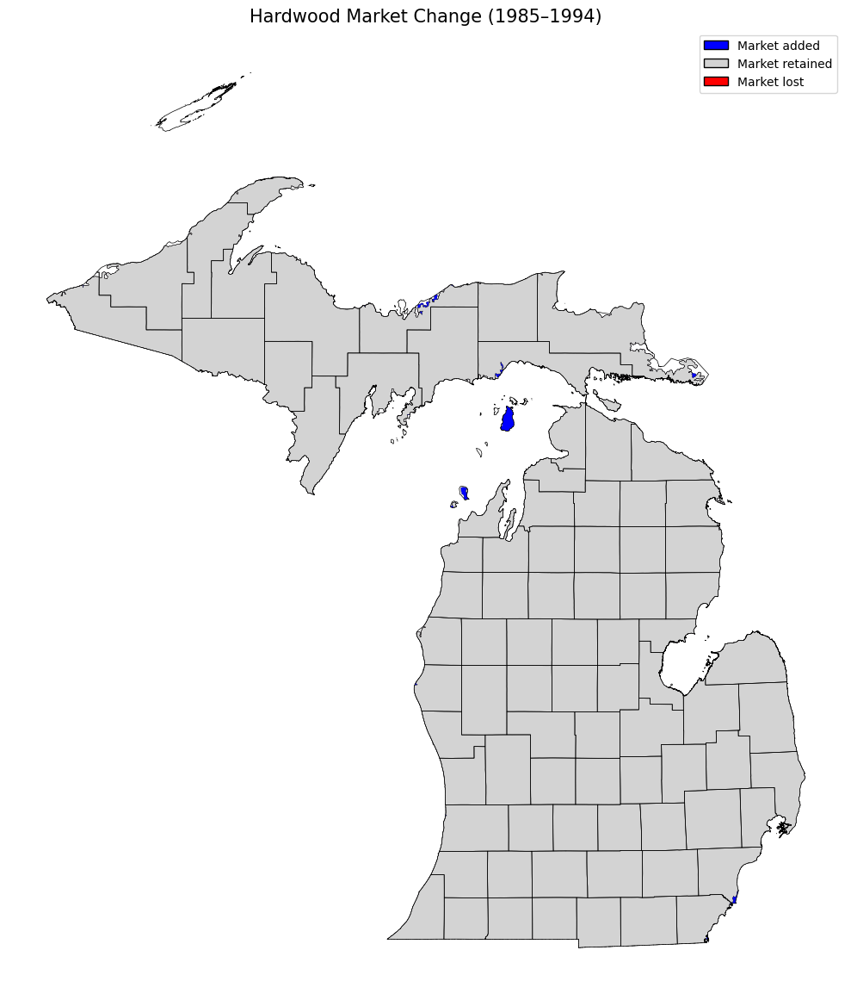

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (use Colab base_path) ---
change_fp   = os.path.join(base_path, "hardwood_change_1985-1994.shp")  # <-- updated to hardwood 1985–1994
counties_fp = os.path.join(base_path, "Counties_(v17a).shp")

# --- Load ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by status ---
retain = gdf_change[gdf_change["status"] == "Market Retain"]
loss   = gdf_change[gdf_change["status"] == "Market Loss"]
add    = gdf_change[gdf_change["status"] == "Market Add"]

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Hardwood Market Change (1985–1994)", fontsize=15)  # <-- updated title
ax.axis('off')
plt.tight_layout()
plt.show()


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Paths from your existing Colab base_path
raster_path    = os.path.join(base_path, "lulc2001.tif")
shapefile_path = os.path.join(base_path, "hardwood_change_1985-1994.shp")  # <-- switched to hardwood 1985–1994

# ✅ Forest land cover class codes
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# ✅ Open raster
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # ✅ Open shapefile
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # ✅ Loop through features
        for feature in shp:
            polygon_label = feature["properties"].get("status", "unknown")  # 'status' column
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' has a forest area of {forest_area_acres:,.2f} acres.")


Polygon 'Market Retain' has a forest area of 15,561,805.17 acres.
Polygon 'Market Loss' has a forest area of 996.99 acres.


In [14]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "hardwood_change_1985-1994.shp")  # <-- updated for hardwood 1985–1994

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 18721215.34 acres.
   White/Red/Jack Pine Group: 2422323.98 acres
   Spruce/Fir Group: 3198959.55 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Pine Group: 30.89 acres
   Oak/Hickory Group: 154224.41 acres
   Elm/Ash/Cottonwood Group: 179599.00 acres
   Maple/Beech/Birch Group: 4012846.20 acres
   Aspen/Birch Group: 8753092.31 acres

Polygon 'Market Loss' has a forest area of 756.76 acres.
   White/Red/Jack Pine Group: 169.88 acres
   Spruce/Fir Group: 169.88 acres
   Maple/Beech/Birch Group: 247.11 acres
   Aspen/Birch Group: 169.88 acres

Polygon 'Market Add' has a forest area of 50687.41 acres.
   White/Red/Jack Pine Group: 4386.11 acres
   Spruce/Fir Group: 12231.70 acres
   Maple/Beech/Birch Group: 401.55 acres
   Aspen/Birch Group: 33668.06 acres



# 1994-2002

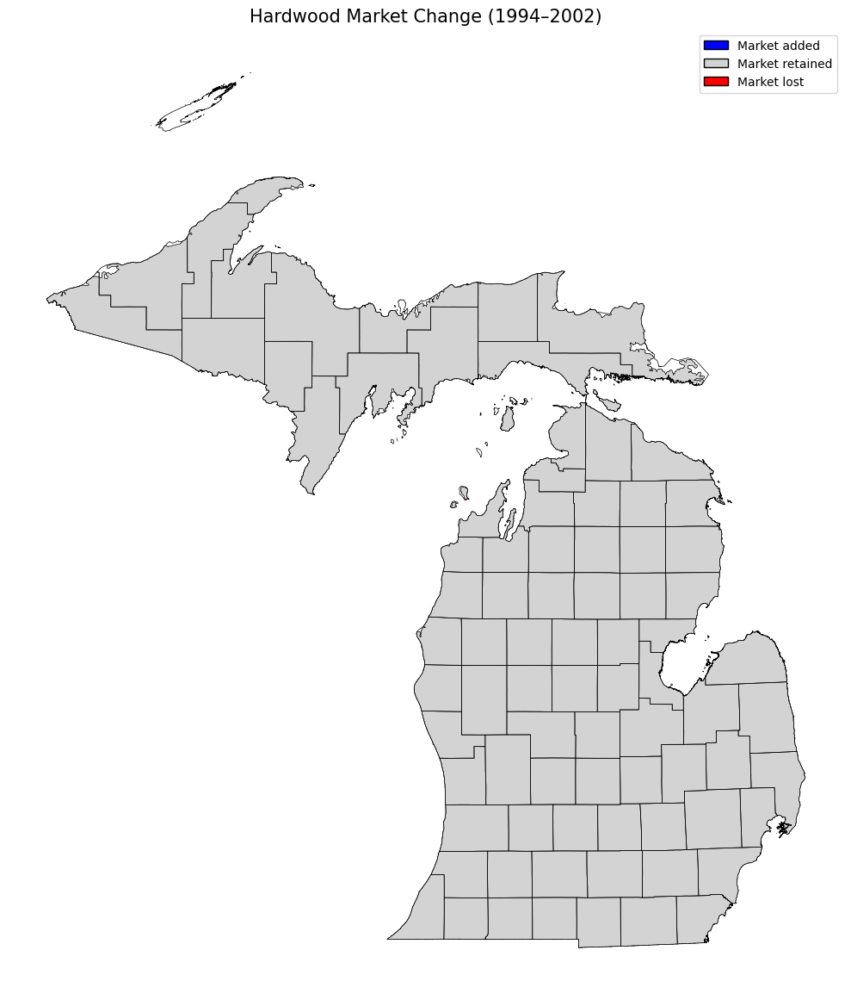

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (use Colab base_path) ---
change_fp   = os.path.join(base_path, "hardwood_change_1994-2002.shp")  # <-- updated to hardwood 1994–2002
counties_fp = os.path.join(base_path, "Counties_(v17a).shp")

# --- Load ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by status ---
retain = gdf_change[gdf_change["status"] == "Market Retain"]
loss   = gdf_change[gdf_change["status"] == "Market Loss"]
add    = gdf_change[gdf_change["status"] == "Market Add"]

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Hardwood Market Change (1994–2002)", fontsize=15)  # <-- updated title
ax.axis('off')
plt.tight_layout()
plt.show()


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Paths from your existing Colab base_path
raster_path    = os.path.join(base_path, "lulc2001.tif")
shapefile_path = os.path.join(base_path, "hardwood_change_1994-2002.shp")  # <-- switched to hardwood 1994–2002

# ✅ Forest land cover class codes
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# ✅ Open raster
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # ✅ Open shapefile
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # ✅ Loop through features
        for feature in shp:
            polygon_label = feature["properties"].get("status", "unknown")  # 'status' column
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' has a forest area of {forest_area_acres:,.2f} acres.")


In [15]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "hardwood_change_1994-2002.shp")  # <-- updated for hardwood 1994–2002

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 18771084.22 acres.
   White/Red/Jack Pine Group: 2426571.10 acres
   Spruce/Fir Group: 3210959.59 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Pine Group: 30.89 acres
   Oak/Hickory Group: 154224.41 acres
   Elm/Ash/Cottonwood Group: 179599.00 acres
   Maple/Beech/Birch Group: 4013185.97 acres
   Aspen/Birch Group: 8786374.26 acres

Polygon 'Market Loss' has a forest area of 818.54 acres.
   White/Red/Jack Pine Group: 139.00 acres
   Spruce/Fir Group: 231.66 acres
   Maple/Beech/Birch Group: 61.78 acres
   Aspen/Birch Group: 386.10 acres

Polygon 'Market Add' has a forest area of 617.76 acres.
   White/Red/Jack Pine Group: 46.33 acres
   Spruce/Fir Group: 231.66 acres
   Maple/Beech/Birch Group: 139.00 acres
   Aspen/Birch Group: 200.77 acres



# 2002-2018

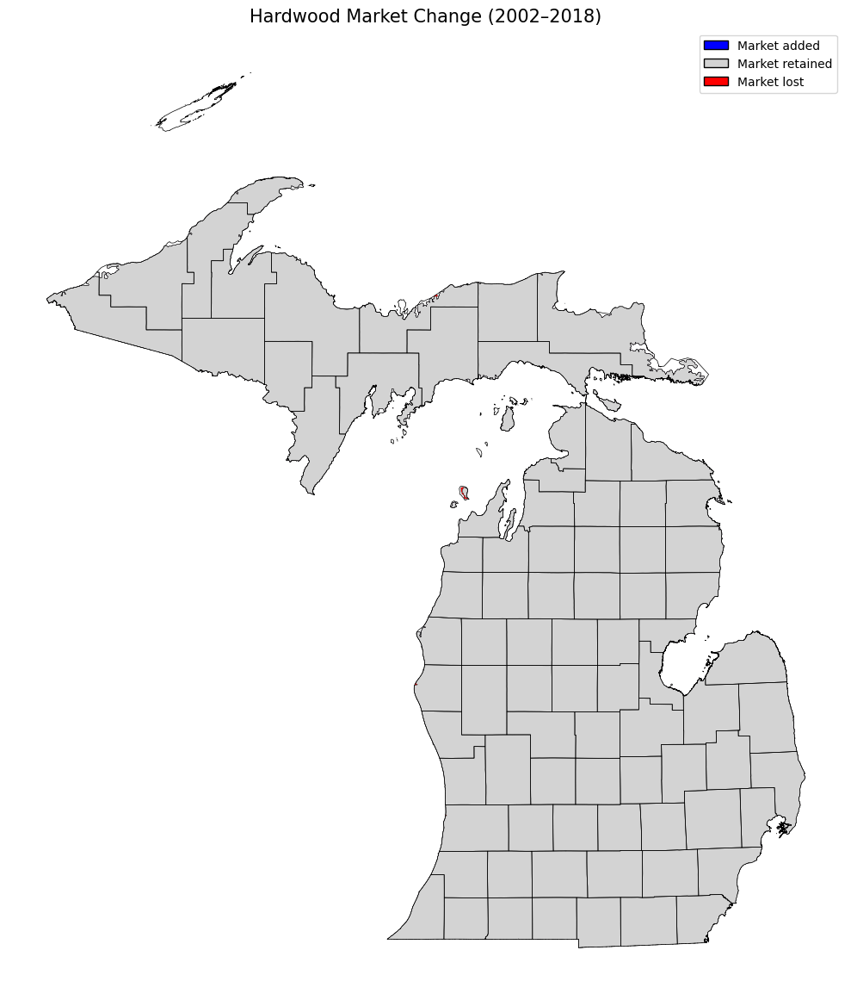

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (use Colab base_path) ---
change_fp   = os.path.join(base_path, "hardwood_change_2002-2018.shp")  # <-- updated to hardwood 2002–2018
counties_fp = os.path.join(base_path, "Counties_(v17a).shp")

# --- Load ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by status ---
retain = gdf_change[gdf_change["status"] == "Market Retain"]
loss   = gdf_change[gdf_change["status"] == "Market Loss"]
add    = gdf_change[gdf_change["status"] == "Market Add"]

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Hardwood Market Change (2002–2018)", fontsize=15)  # <-- updated title
ax.axis('off')
plt.tight_layout()
plt.show()


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Paths from your existing Colab base_path
raster_path    = os.path.join(base_path, "lulc2001.tif")
shapefile_path = os.path.join(base_path, "hardwood_change_2002-2018.shp")  # <-- switched to hardwood 2002–2018

# ✅ Forest land cover class codes
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# ✅ Open raster
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # ✅ Open shapefile
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # ✅ Loop through features
        for feature in shp:
            polygon_label = feature["properties"].get("status", "unknown")  # 'status' column
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' has a forest area of {forest_area_acres:,.2f} acres.")


In [16]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "hardwood_change_2002-2018.shp")  # <-- updated for hardwood 2002–2018

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 18767315.87 acres.
   White/Red/Jack Pine Group: 2426015.11 acres
   Spruce/Fir Group: 3210975.03 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Pine Group: 30.89 acres
   Oak/Hickory Group: 154224.41 acres
   Elm/Ash/Cottonwood Group: 179599.00 acres
   Maple/Beech/Birch Group: 4013170.53 acres
   Aspen/Birch Group: 8783161.90 acres

Polygon 'Market Loss' has a forest area of 4386.11 acres.
   White/Red/Jack Pine Group: 602.32 acres
   Spruce/Fir Group: 216.22 acres
   Maple/Beech/Birch Group: 154.44 acres
   Aspen/Birch Group: 3413.14 acres

Polygon 'Market Add' has a forest area of 756.76 acres.
   White/Red/Jack Pine Group: 216.22 acres
   Spruce/Fir Group: 200.77 acres
   Maple/Beech/Birch Group: 154.44 acres
   Aspen/Birch Group: 185.33 acres



# 2018-2023


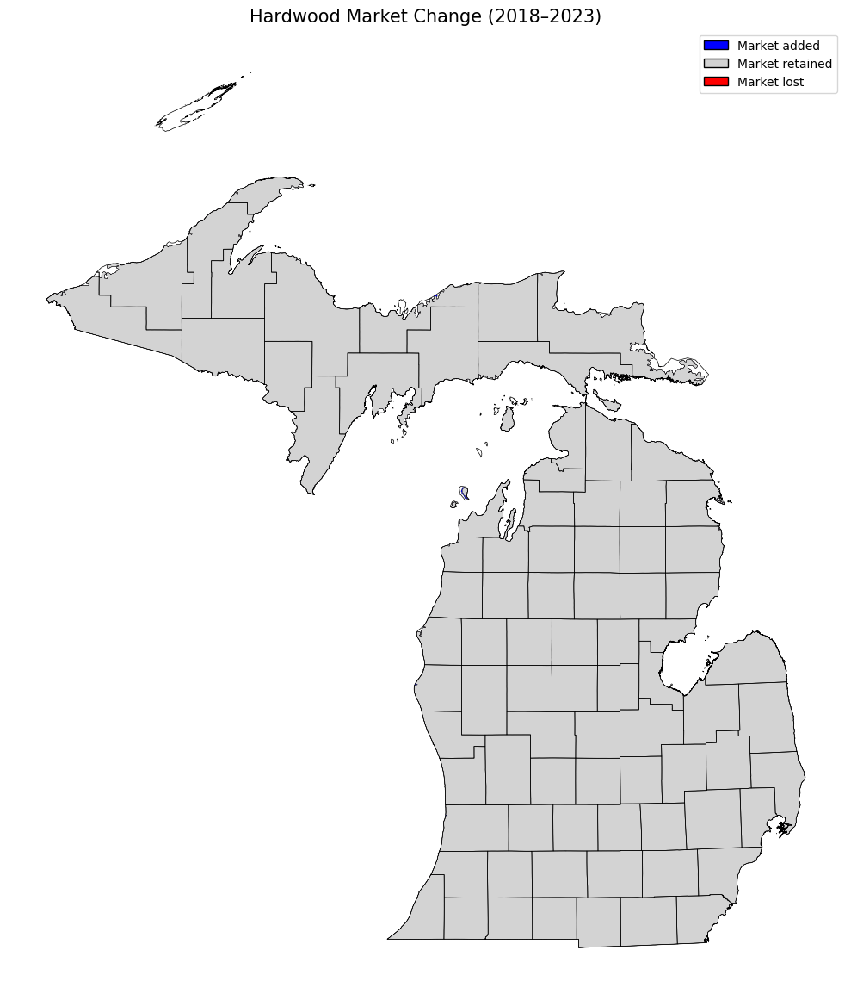

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (use Colab base_path) ---
change_fp   = os.path.join(base_path, "hardwood_change_2018-2023.shp")  # <-- updated to hardwood 2018–2023
counties_fp = os.path.join(base_path, "Counties_(v17a).shp")

# --- Load ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by status ---
retain = gdf_change[gdf_change["status"] == "Market Retain"]
loss   = gdf_change[gdf_change["status"] == "Market Loss"]
add    = gdf_change[gdf_change["status"] == "Market Add"]

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Hardwood Market Change (2018–2023)", fontsize=15)  # <-- updated title
ax.axis('off')
plt.tight_layout()
plt.show()


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Paths from your existing Colab base_path
raster_path    = os.path.join(base_path, "lulc2001.tif")
shapefile_path = os.path.join(base_path, "hardwood_change_2018-2023.shp")  # <-- switched to hardwood 2018–2023

# ✅ Forest land cover class codes
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# ✅ Open raster
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # ✅ Open shapefile
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # ✅ Loop through features
        for feature in shp:
            polygon_label = feature["properties"].get("status", "unknown")  # 'status' column
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' has a forest area of {forest_area_acres:,.2f} acres.")


In [17]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "hardwood_change_2018-2023.shp")  # <-- updated for hardwood 2018–2023

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 18767933.63 acres.
   White/Red/Jack Pine Group: 2426215.89 acres
   Spruce/Fir Group: 3211160.36 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Pine Group: 30.89 acres
   Oak/Hickory Group: 154224.41 acres
   Elm/Ash/Cottonwood Group: 179599.00 acres
   Maple/Beech/Birch Group: 4013278.64 acres
   Aspen/Birch Group: 8783285.45 acres

Polygon 'Market Loss' has a forest area of 139.00 acres.
   White/Red/Jack Pine Group: 15.44 acres
   Spruce/Fir Group: 15.44 acres
   Maple/Beech/Birch Group: 46.33 acres
   Aspen/Birch Group: 61.78 acres

Polygon 'Market Add' has a forest area of 4123.56 acres.
   White/Red/Jack Pine Group: 617.76 acres
   Spruce/Fir Group: 386.10 acres
   Maple/Beech/Birch Group: 447.88 acres
   Aspen/Birch Group: 2671.82 acres



# 1985-2023

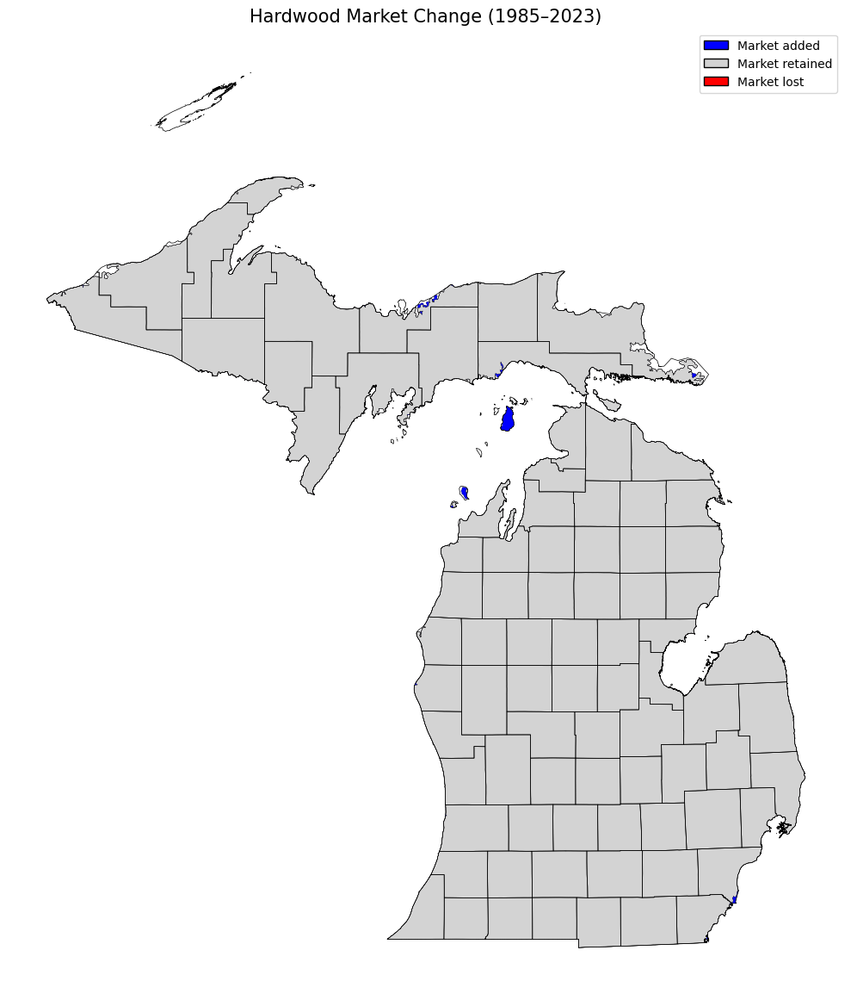

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (use Colab base_path) ---
change_fp   = os.path.join(base_path, "hardwood_change_1985-2023.shp")  # <-- updated to hardwood 1985–2023
counties_fp = os.path.join(base_path, "Counties_(v17a).shp")

# --- Load ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by status ---
retain = gdf_change[gdf_change["status"] == "Market Retain"]
loss   = gdf_change[gdf_change["status"] == "Market Loss"]
add    = gdf_change[gdf_change["status"] == "Market Add"]

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Hardwood Market Change (1985–2023)", fontsize=15)  # <-- updated title
ax.axis('off')
plt.tight_layout()
plt.show()


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Paths from your existing Colab base_path
raster_path    = os.path.join(base_path, "lulc2001.tif")
shapefile_path = os.path.join(base_path, "hardwood_change_1985-2023.shp")  # <-- switched to hardwood 1985–2023

# ✅ Forest land cover class codes
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# ✅ Open raster
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # ✅ Open shapefile
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # ✅ Loop through features
        for feature in shp:
            polygon_label = feature["properties"].get("status", "unknown")  # 'status' column
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' has a forest area of {forest_area_acres:,.2f} acres.")


In [18]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "hardwood_change_1985-2023.shp")  # <-- updated for hardwood 1985–2023

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 18721817.66 acres.
   White/Red/Jack Pine Group: 2422493.87 acres
   Spruce/Fir Group: 3199129.44 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Pine Group: 30.89 acres
   Oak/Hickory Group: 154224.41 acres
   Elm/Ash/Cottonwood Group: 179599.00 acres
   Maple/Beech/Birch Group: 4013016.09 acres
   Aspen/Birch Group: 8753184.97 acres

Polygon 'Market Loss' has a forest area of 154.44 acres.
   Maple/Beech/Birch Group: 77.22 acres
   Aspen/Birch Group: 77.22 acres

Polygon 'Market Add' has a forest area of 50239.54 acres.
   White/Red/Jack Pine Group: 4339.78 acres
   Spruce/Fir Group: 12417.03 acres
   Maple/Beech/Birch Group: 710.43 acres
   Aspen/Birch Group: 32772.30 acres



# 1994-2023

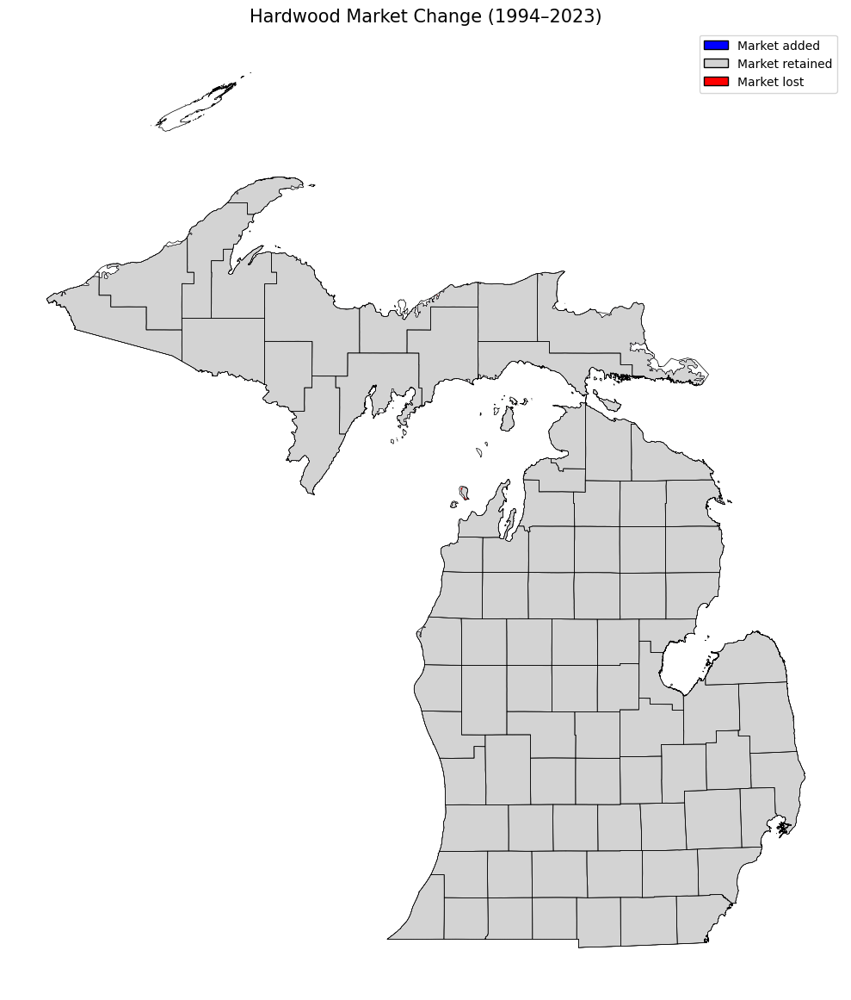

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (use Colab base_path) ---
change_fp   = os.path.join(base_path, "hardwood_change_1994-2023.shp")  # <-- updated to hardwood 1994–2023
counties_fp = os.path.join(base_path, "Counties_(v17a).shp")

# --- Load ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by status ---
retain = gdf_change[gdf_change["status"] == "Market Retain"]
loss   = gdf_change[gdf_change["status"] == "Market Loss"]
add    = gdf_change[gdf_change["status"] == "Market Add"]

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Hardwood Market Change (1994–2023)", fontsize=15)  # <-- updated title
ax.axis('off')
plt.tight_layout()
plt.show()


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Paths from your existing Colab base_path
raster_path    = os.path.join(base_path, "lulc2001.tif")
shapefile_path = os.path.join(base_path, "hardwood_change_1994-2023.shp")  # <-- switched to hardwood 1994–2023

# ✅ Forest land cover class codes
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# ✅ Open raster
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # ✅ Open shapefile
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # ✅ Loop through features
        for feature in shp:
            polygon_label = feature["properties"].get("status", "unknown")  # 'status' column
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' has a forest area of {forest_area_acres:,.2f} acres.")


In [19]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "hardwood_change_1994-2023.shp")  # <-- updated for hardwood 1994–2023

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 18770543.68 acres.
   White/Red/Jack Pine Group: 2426601.99 acres
   Spruce/Fir Group: 3211129.48 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Pine Group: 30.89 acres
   Oak/Hickory Group: 154224.41 acres
   Elm/Ash/Cottonwood Group: 179599.00 acres
   Maple/Beech/Birch Group: 4013247.75 acres
   Aspen/Birch Group: 8785571.17 acres

Polygon 'Market Loss' has a forest area of 1359.08 acres.
   White/Red/Jack Pine Group: 108.11 acres
   Spruce/Fir Group: 61.78 acres
   Aspen/Birch Group: 1189.19 acres

Polygon 'Market Add' has a forest area of 1513.52 acres.
   White/Red/Jack Pine Group: 231.66 acres
   Spruce/Fir Group: 416.99 acres
   Maple/Beech/Birch Group: 478.77 acres
   Aspen/Birch Group: 386.10 acres



# 2002-2023

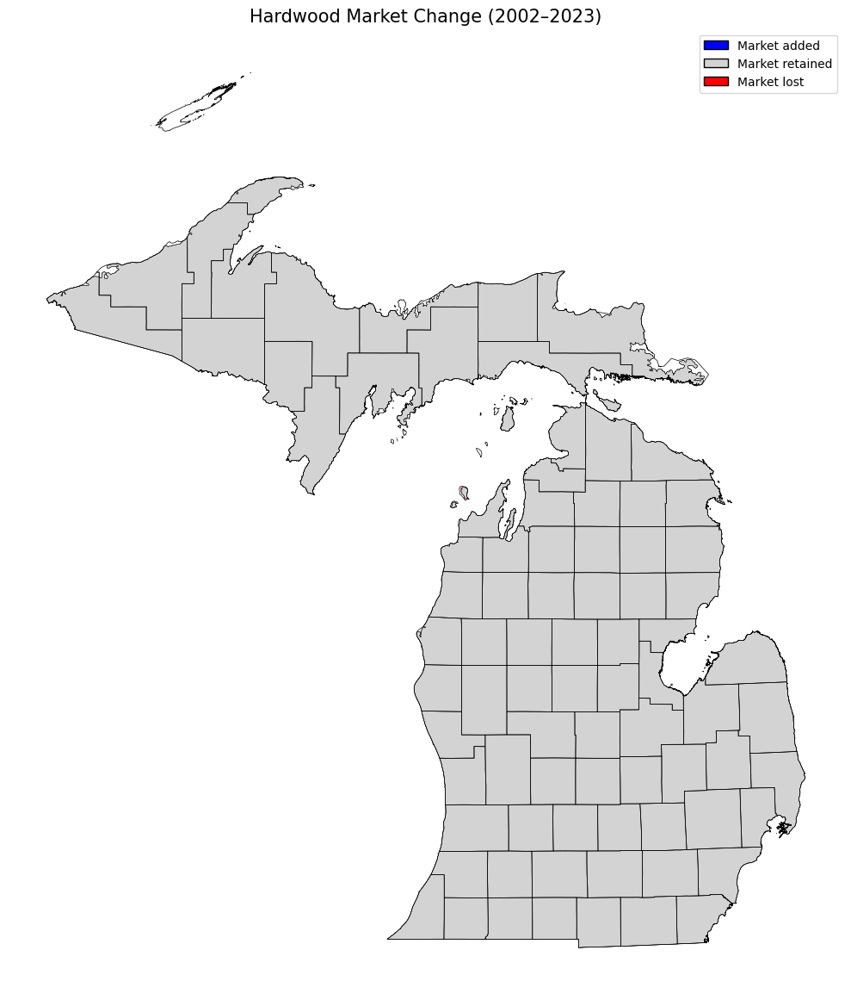

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (use Colab base_path) ---
change_fp   = os.path.join(base_path, "hardwood_change_2002-2023.shp")  # <-- updated to hardwood 2002–2023
counties_fp = os.path.join(base_path, "Counties_(v17a).shp")

# --- Load ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by status ---
retain = gdf_change[gdf_change["status"] == "Market Retain"]
loss   = gdf_change[gdf_change["status"] == "Market Loss"]
add    = gdf_change[gdf_change["status"] == "Market Add"]

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Hardwood Market Change (2002–2023)", fontsize=15)  # <-- updated title
ax.axis('off')
plt.tight_layout()
plt.show()


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Paths from your existing Colab base_path
raster_path    = os.path.join(base_path, "lulc2001.tif")
shapefile_path = os.path.join(base_path, "hardwood_change_2002-2023.shp")  # <-- switched to hardwood 2002–2023

# ✅ Forest land cover class codes
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# ✅ Open raster
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # ✅ Open shapefile
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # ✅ Loop through features
        for feature in shp:
            polygon_label = feature["properties"].get("status", "unknown")  # 'status' column
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' has a forest area of {forest_area_acres:,.2f} acres.")


In [20]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "hardwood_change_2002-2023.shp")  # <-- updated for hardwood 2002–2023

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 18770528.23 acres.
   White/Red/Jack Pine Group: 2426524.77 acres
   Spruce/Fir Group: 3211098.59 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Pine Group: 30.89 acres
   Oak/Hickory Group: 154224.41 acres
   Elm/Ash/Cottonwood Group: 179599.00 acres
   Maple/Beech/Birch Group: 4013263.19 acres
   Aspen/Birch Group: 8785648.39 acres

Polygon 'Market Loss' has a forest area of 1173.75 acres.
   White/Red/Jack Pine Group: 92.66 acres
   Spruce/Fir Group: 92.66 acres
   Maple/Beech/Birch Group: 61.78 acres
   Aspen/Birch Group: 926.64 acres

Polygon 'Market Add' has a forest area of 1528.96 acres.
   White/Red/Jack Pine Group: 308.88 acres
   Spruce/Fir Group: 447.88 acres
   Maple/Beech/Birch Group: 463.32 acres
   Aspen/Birch Group: 308.88 acres



# Softwood Sawlogs

# 1985-1994

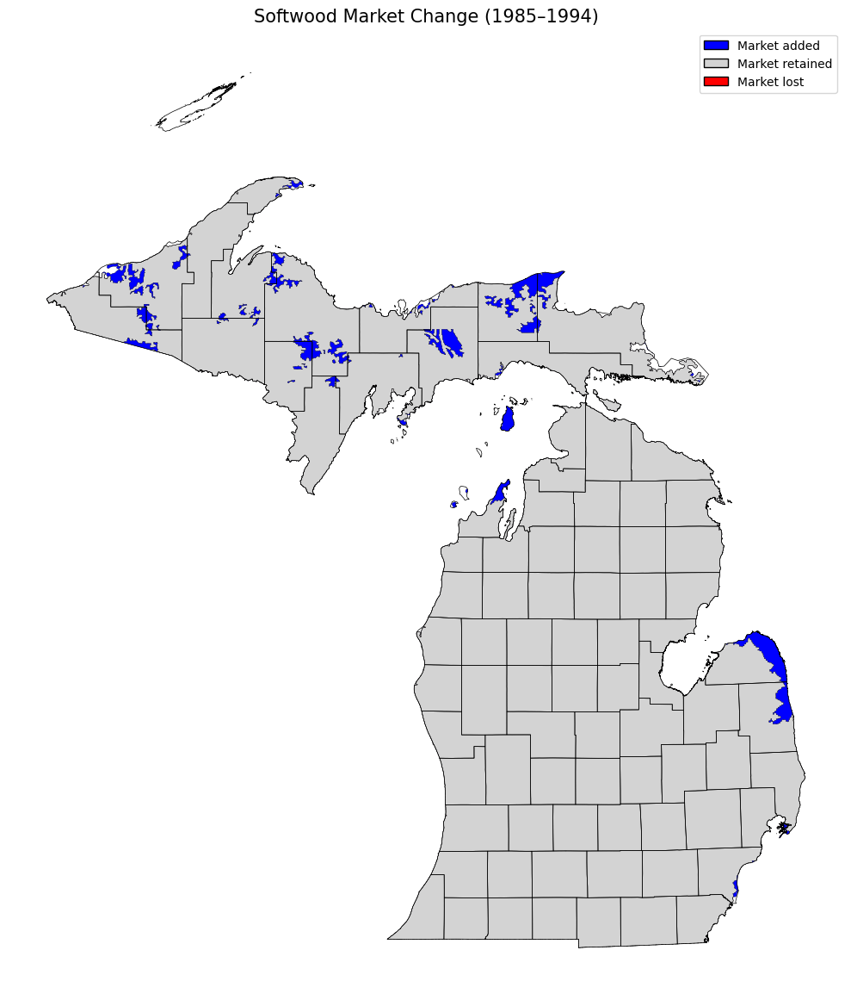

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (use Colab base_path) ---
change_fp   = os.path.join(base_path, "softwood_change_1985-1994.shp")  # <-- updated to softwood 1985–1994
counties_fp = os.path.join(base_path, "Counties_(v17a).shp")

# --- Load ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by status ---
retain = gdf_change[gdf_change["status"] == "Market Retain"]
loss   = gdf_change[gdf_change["status"] == "Market Loss"]
add    = gdf_change[gdf_change["status"] == "Market Add"]

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Softwood Market Change (1985–1994)", fontsize=15)  # <-- updated title
ax.axis('off')
plt.tight_layout()
plt.show()


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Paths from your existing Colab base_path
raster_path    = os.path.join(base_path, "lulc2001.tif")
shapefile_path = os.path.join(base_path, "softwood_change_1985-1994.shp")  # <-- switched to softwood 1985–1994

# ✅ Forest land cover class codes
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# ✅ Open raster
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # ✅ Open shapefile
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # ✅ Loop through features
        for feature in shp:
            polygon_label = feature["properties"].get("status", "unknown")  # 'status' column
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' has a forest area of {forest_area_acres:,.2f} acres.")


In [21]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "softwood_change_1985-1994.shp")  # <-- updated for softwood 1985–1994

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 18168055.36 acres.
   White/Red/Jack Pine Group: 2348563.14 acres
   Spruce/Fir Group: 3024812.31 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Pine Group: 30.89 acres
   Oak/Hickory Group: 154054.52 acres
   Elm/Ash/Cottonwood Group: 179089.35 acres
   Maple/Beech/Birch Group: 3815316.64 acres
   Aspen/Birch Group: 8646049.51 acres

Polygon 'Market Loss' has a forest area of 401.55 acres.
   White/Red/Jack Pine Group: 92.66 acres
   Spruce/Fir Group: 61.78 acres
   Oak/Hickory Group: 15.44 acres
   Maple/Beech/Birch Group: 46.33 acres
   Aspen/Birch Group: 185.33 acres

Polygon 'Market Add' has a forest area of 586287.50 acres.
   White/Red/Jack Pine Group: 76340.00 acres
   Spruce/Fir Group: 183645.35 acres
   Oak/Hickory Group: 154.44 acres
   Elm/Ash/Cottonwood Group: 509.65 acres
   Maple/Beech/Birch Group: 198008.33 acres
   Aspen/Birch Group: 127629.73 acres



# 1994-2002

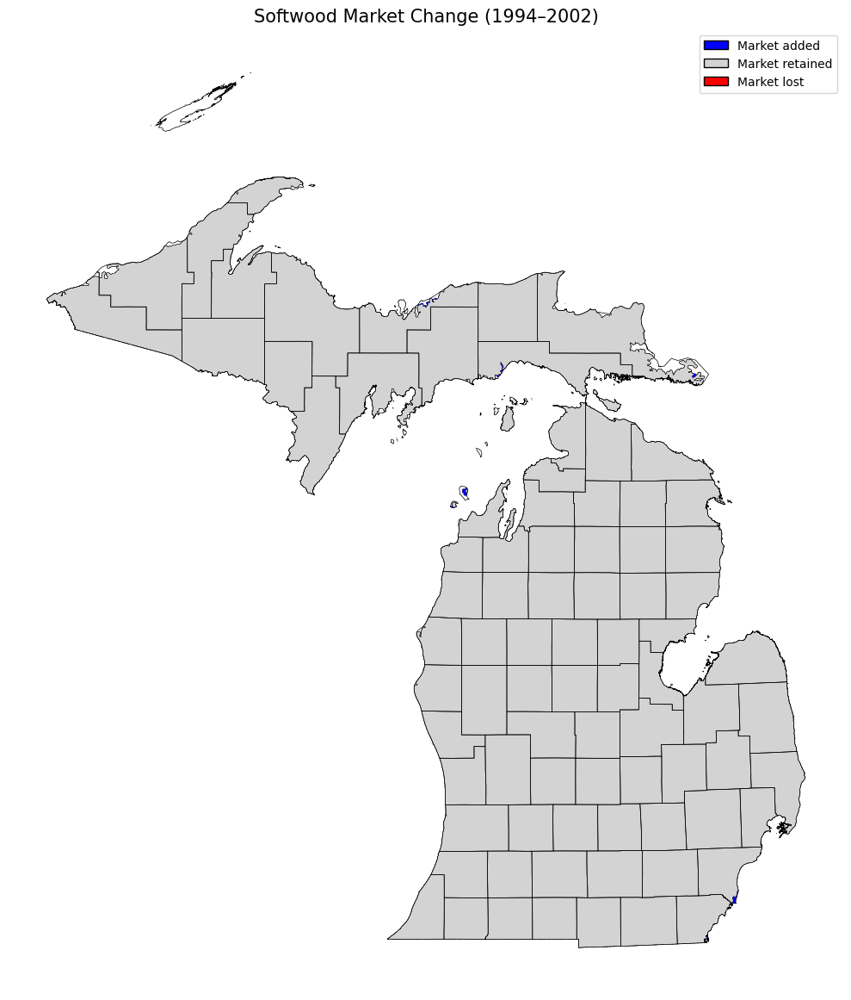

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (use Colab base_path) ---
change_fp   = os.path.join(base_path, "softwood_change_1994-2002.shp")  # <-- updated to softwood 1994–2002
counties_fp = os.path.join(base_path, "Counties_(v17a).shp")

# --- Load ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by status ---
retain = gdf_change[gdf_change["status"] == "Market Retain"]
loss   = gdf_change[gdf_change["status"] == "Market Loss"]
add    = gdf_change[gdf_change["status"] == "Market Add"]

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Softwood Market Change (1994–2002)", fontsize=15)  # <-- updated title
ax.axis('off')
plt.tight_layout()
plt.show()


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Paths from your existing Colab base_path
raster_path    = os.path.join(base_path, "lulc2001.tif")
shapefile_path = os.path.join(base_path, "softwood_change_1994-2002.shp")  # <-- switched to softwood 1994–2002

# ✅ Forest land cover class codes
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# ✅ Open raster
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # ✅ Open shapefile
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # ✅ Loop through features
        for feature in shp:
            polygon_label = feature["properties"].get("status", "unknown")  # 'status' column
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' has a forest area of {forest_area_acres:,.2f} acres.")


In [22]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "softwood_change_1994-2002.shp")  # <-- updated for softwood 1994–2002

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 18753833.20 acres.
   White/Red/Jack Pine Group: 2424733.26 acres
   Spruce/Fir Group: 3208318.66 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Pine Group: 30.89 acres
   Oak/Hickory Group: 154208.96 acres
   Elm/Ash/Cottonwood Group: 179599.00 acres
   Maple/Beech/Birch Group: 4013201.42 acres
   Aspen/Birch Group: 8773602.02 acres

Polygon 'Market Loss' has a forest area of 509.65 acres.
   White/Red/Jack Pine Group: 169.88 acres
   Spruce/Fir Group: 139.00 acres
   Maple/Beech/Birch Group: 123.55 acres
   Aspen/Birch Group: 77.22 acres

Polygon 'Market Add' has a forest area of 12556.02 acres.
   White/Red/Jack Pine Group: 1312.75 acres
   Spruce/Fir Group: 2841.71 acres
   Oak/Hickory Group: 15.44 acres
   Maple/Beech/Birch Group: 154.44 acres
   Aspen/Birch Group: 8231.69 acres



# 2002-2018

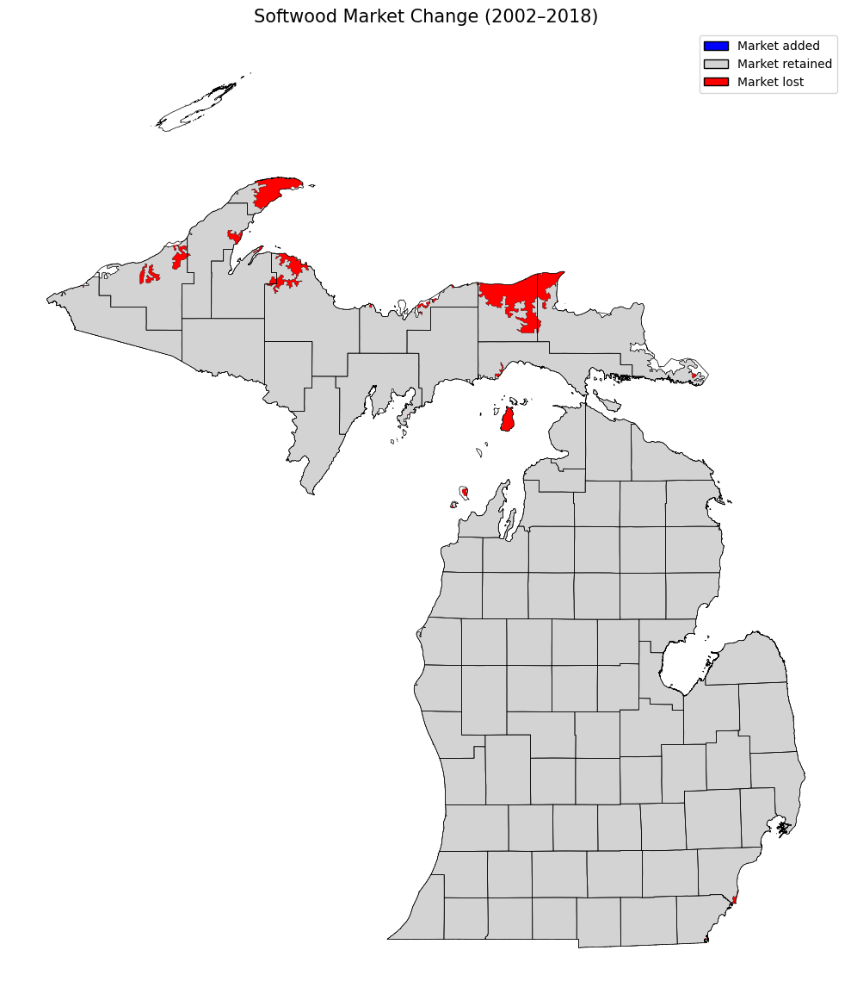

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (use Colab base_path) ---
change_fp   = os.path.join(base_path, "softwood_change_2002-2018.shp")  # <-- updated to softwood 2002–2018
counties_fp = os.path.join(base_path, "Counties_(v17a).shp")

# --- Load ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by status ---
retain = gdf_change[gdf_change["status"] == "Market Retain"]
loss   = gdf_change[gdf_change["status"] == "Market Loss"]
add    = gdf_change[gdf_change["status"] == "Market Add"]

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Softwood Market Change (2002–2018)", fontsize=15)  # <-- updated title
ax.axis('off')
plt.tight_layout()
plt.show()


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Paths from your existing Colab base_path
raster_path    = os.path.join(base_path, "lulc2001.tif")
shapefile_path = os.path.join(base_path, "softwood_change_2002-2018.shp")  # <-- switched to softwood 2002–2018

# ✅ Forest land cover class codes
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# ✅ Open raster
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # ✅ Open shapefile
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # ✅ Loop through features
        for feature in shp:
            polygon_label = feature["properties"].get("status", "unknown")  # 'status' column
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' has a forest area of {forest_area_acres:,.2f} acres.")


In [23]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "softwood_change_2002-2018.shp")  # <-- updated for softwood 2002–2018

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 18186433.79 acres.
   White/Red/Jack Pine Group: 2306091.97 acres
   Spruce/Fir Group: 3060518.98 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Pine Group: 30.89 acres
   Oak/Hickory Group: 153838.31 acres
   Elm/Ash/Cottonwood Group: 177174.29 acres
   Maple/Beech/Birch Group: 3801123.55 acres
   Aspen/Birch Group: 8687516.82 acres

Polygon 'Market Loss' has a forest area of 579955.44 acres.
   White/Red/Jack Pine Group: 119954.03 acres
   Spruce/Fir Group: 150641.39 acres
   Oak/Hickory Group: 386.10 acres
   Elm/Ash/Cottonwood Group: 2424.72 acres
   Maple/Beech/Birch Group: 212232.31 acres
   Aspen/Birch Group: 94316.89 acres

Polygon 'Market Add' has a forest area of 586.87 acres.
   White/Red/Jack Pine Group: 108.11 acres
   Spruce/Fir Group: 108.11 acres
   Maple/Beech/Birch Group: 154.44 acres
   Aspen/Birch Group: 216.22 acres



# 2018-2023

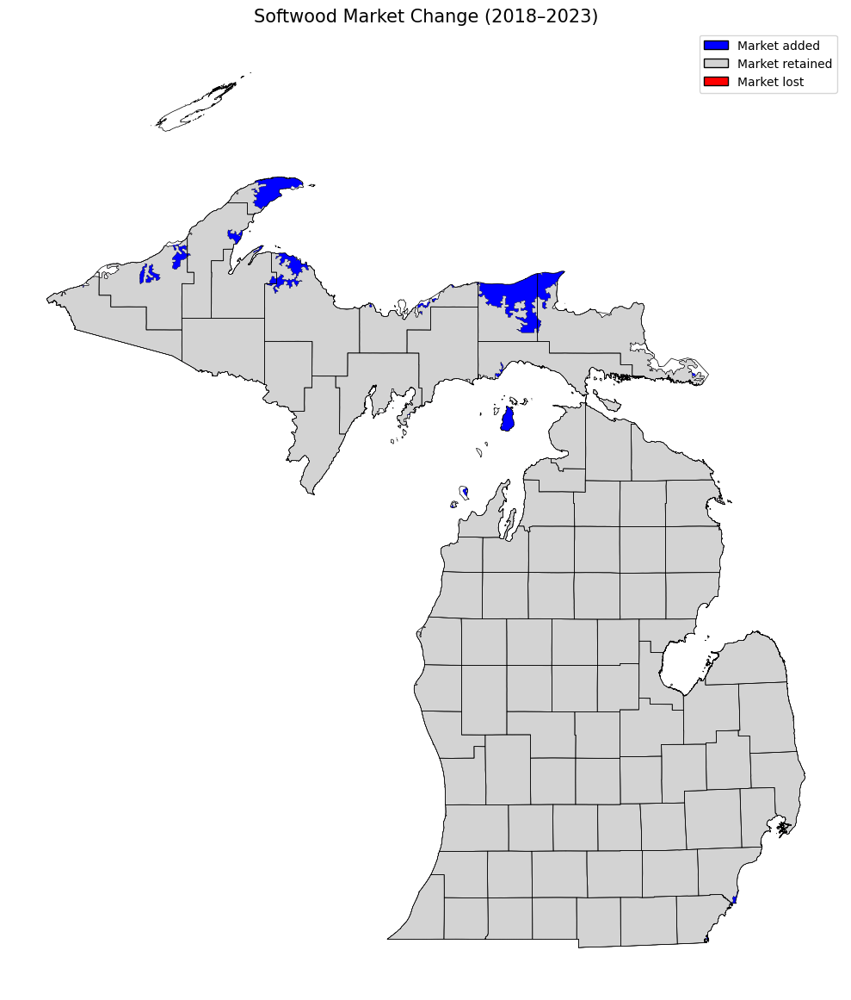

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (use Colab base_path) ---
change_fp   = os.path.join(base_path, "softwood_change_2018-2023.shp")  # <-- updated to softwood 2018–2023
counties_fp = os.path.join(base_path, "Counties_(v17a).shp")

# --- Load ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by status ---
retain = gdf_change[gdf_change["status"] == "Market Retain"]
loss   = gdf_change[gdf_change["status"] == "Market Loss"]
add    = gdf_change[gdf_change["status"] == "Market Add"]

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Softwood Market Change (2018–2023)", fontsize=15)  # <-- updated title
ax.axis('off')
plt.tight_layout()
plt.show()


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Paths from your existing Colab base_path
raster_path    = os.path.join(base_path, "lulc2001.tif")
shapefile_path = os.path.join(base_path, "softwood_change_2018-2023.shp")  # <-- switched to softwood 2018–2023

# ✅ Forest land cover class codes
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# ✅ Open raster
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # ✅ Open shapefile
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # ✅ Loop through features
        for feature in shp:
            polygon_label = feature["properties"].get("status", "unknown")  # 'status' column
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' has a forest area of {forest_area_acres:,.2f} acres.")


In [24]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "softwood_change_2018-2023.shp")  # <-- updated for softwood 2018–2023

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 18186789.00 acres.
   White/Red/Jack Pine Group: 2306200.08 acres
   Spruce/Fir Group: 3060611.64 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Pine Group: 30.89 acres
   Oak/Hickory Group: 153838.31 acres
   Elm/Ash/Cottonwood Group: 177174.29 acres
   Maple/Beech/Birch Group: 3801169.88 acres
   Aspen/Birch Group: 8687624.93 acres

Polygon 'Market Loss' has a forest area of 231.66 acres.
   Spruce/Fir Group: 15.44 acres
   Maple/Beech/Birch Group: 108.11 acres
   Aspen/Birch Group: 108.11 acres

Polygon 'Market Add' has a forest area of 577484.39 acres.
   White/Red/Jack Pine Group: 119892.26 acres
   Spruce/Fir Group: 150347.95 acres
   Oak/Hickory Group: 386.10 acres
   Elm/Ash/Cottonwood Group: 2424.72 acres
   Maple/Beech/Birch Group: 212417.64 acres
   Aspen/Birch Group: 92015.72 acres



# 1985-2023

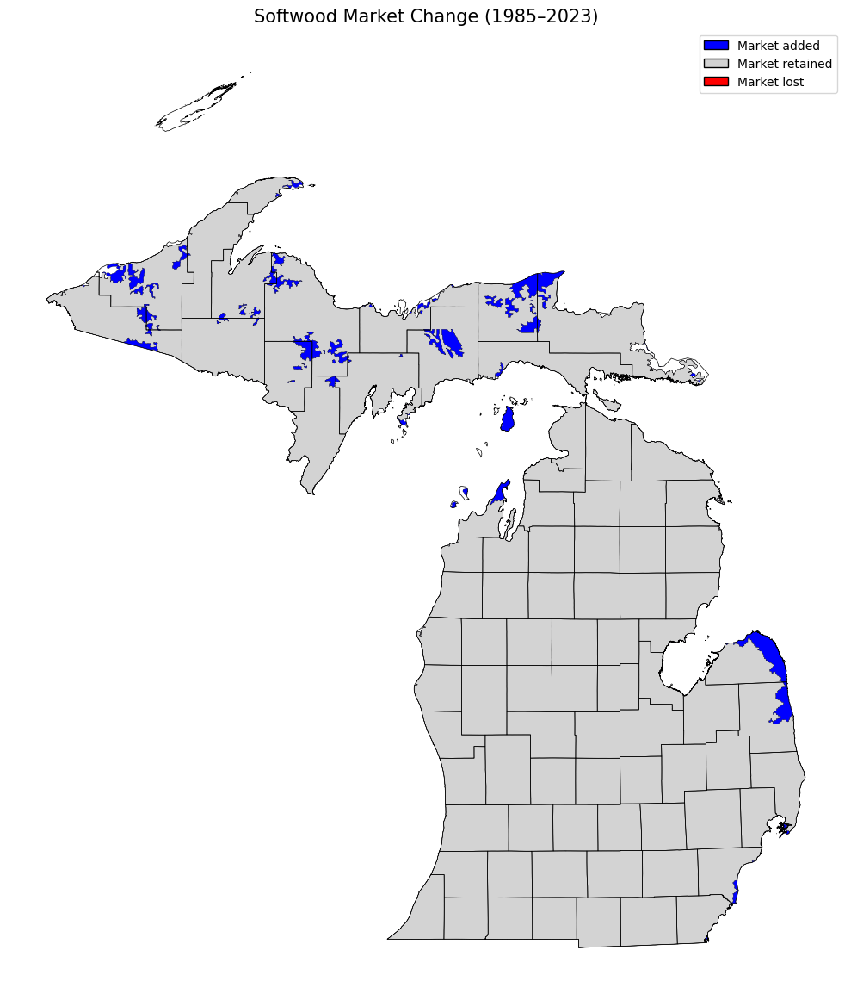

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (use Colab base_path) ---
change_fp   = os.path.join(base_path, "softwood_change_1985-2023.shp")  # <-- updated to softwood 1985–2023
counties_fp = os.path.join(base_path, "Counties_(v17a).shp")

# --- Load ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by status ---
retain = gdf_change[gdf_change["status"] == "Market Retain"]
loss   = gdf_change[gdf_change["status"] == "Market Loss"]
add    = gdf_change[gdf_change["status"] == "Market Add"]

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Softwood Market Change (1985–2023)", fontsize=15)  # <-- updated title
ax.axis('off')
plt.tight_layout()
plt.show()


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Paths from your existing Colab base_path
raster_path    = os.path.join(base_path, "lulc2001.tif")
shapefile_path = os.path.join(base_path, "softwood_change_1985-2023.shp")  # <-- switched to softwood 1985–2023

# ✅ Forest land cover class codes
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# ✅ Open raster
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # ✅ Open shapefile
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # ✅ Loop through features
        for feature in shp:
            polygon_label = feature["properties"].get("status", "unknown")  # 'status' column
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' has a forest area of {forest_area_acres:,.2f} acres.")


In [25]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "softwood_change_1985-2023.shp")  # <-- updated for softwood 1985–2023

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 18168410.57 acres.
   White/Red/Jack Pine Group: 2348655.80 acres
   Spruce/Fir Group: 3024874.08 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Pine Group: 30.89 acres
   Oak/Hickory Group: 154069.97 acres
   Elm/Ash/Cottonwood Group: 179089.35 acres
   Maple/Beech/Birch Group: 3815316.64 acres
   Aspen/Birch Group: 8646234.84 acres

Polygon 'Market Loss' has a forest area of 46.33 acres.
   Maple/Beech/Birch Group: 46.33 acres

Polygon 'Market Add' has a forest area of 595862.82 acres.
   White/Red/Jack Pine Group: 77436.53 acres
   Spruce/Fir Group: 186085.51 acres
   Oak/Hickory Group: 154.44 acres
   Elm/Ash/Cottonwood Group: 509.65 acres
   Maple/Beech/Birch Group: 198270.87 acres
   Aspen/Birch Group: 133405.81 acres



# 1994-2023

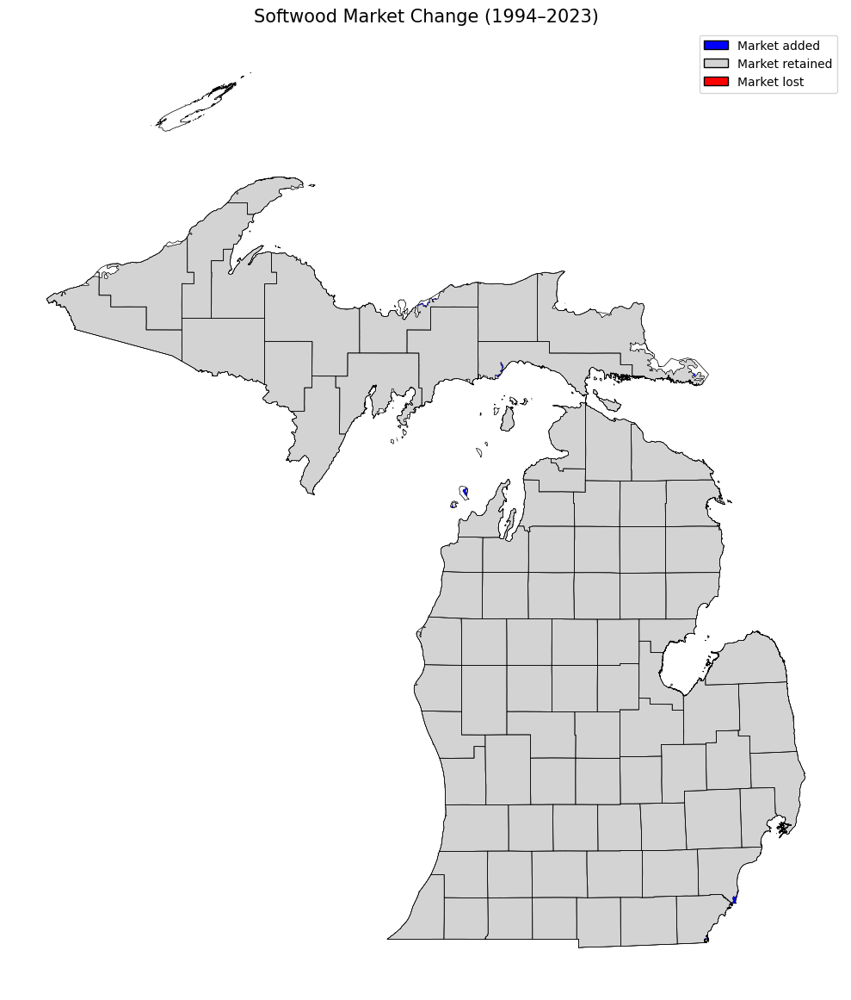

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (use Colab base_path) ---
change_fp   = os.path.join(base_path, "softwood_change_1994-2023.shp")  # <-- updated to softwood 1994–2023
counties_fp = os.path.join(base_path, "Counties_(v17a).shp")

# --- Load ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by status ---
retain = gdf_change[gdf_change["status"] == "Market Retain"]
loss   = gdf_change[gdf_change["status"] == "Market Loss"]
add    = gdf_change[gdf_change["status"] == "Market Add"]

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Softwood Market Change (1994–2023)", fontsize=15)  # <-- updated title
ax.axis('off')
plt.tight_layout()
plt.show()


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Paths from your existing Colab base_path
raster_path    = os.path.join(base_path, "lulc2001.tif")
shapefile_path = os.path.join(base_path, "softwood_change_1994-2023.shp")  # <-- switched to softwood 1994–2023

# ✅ Forest land cover class codes
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# ✅ Open raster
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # ✅ Open shapefile
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # ✅ Loop through features
        for feature in shp:
            polygon_label = feature["properties"].get("status", "unknown")  # 'status' column
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' has a forest area of {forest_area_acres:,.2f} acres.")


In [26]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "softwood_change_1994-2023.shp")  # <-- updated for softwood 1994–2023

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 18754172.97 acres.
   White/Red/Jack Pine Group: 2424856.81 acres
   Spruce/Fir Group: 3208426.76 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Pine Group: 30.89 acres
   Oak/Hickory Group: 154208.96 acres
   Elm/Ash/Cottonwood Group: 179599.00 acres
   Maple/Beech/Birch Group: 4013278.64 acres
   Aspen/Birch Group: 8773632.91 acres

Polygon 'Market Loss' has a forest area of 169.88 acres.
   White/Red/Jack Pine Group: 46.33 acres
   Spruce/Fir Group: 30.89 acres
   Maple/Beech/Birch Group: 46.33 acres
   Aspen/Birch Group: 46.33 acres

Polygon 'Market Add' has a forest area of 10100.42 acres.
   White/Red/Jack Pine Group: 1235.53 acres
   Spruce/Fir Group: 2532.83 acres
   Oak/Hickory Group: 15.44 acres
   Maple/Beech/Birch Group: 308.88 acres
   Aspen/Birch Group: 6007.74 acres



# 2002-2023

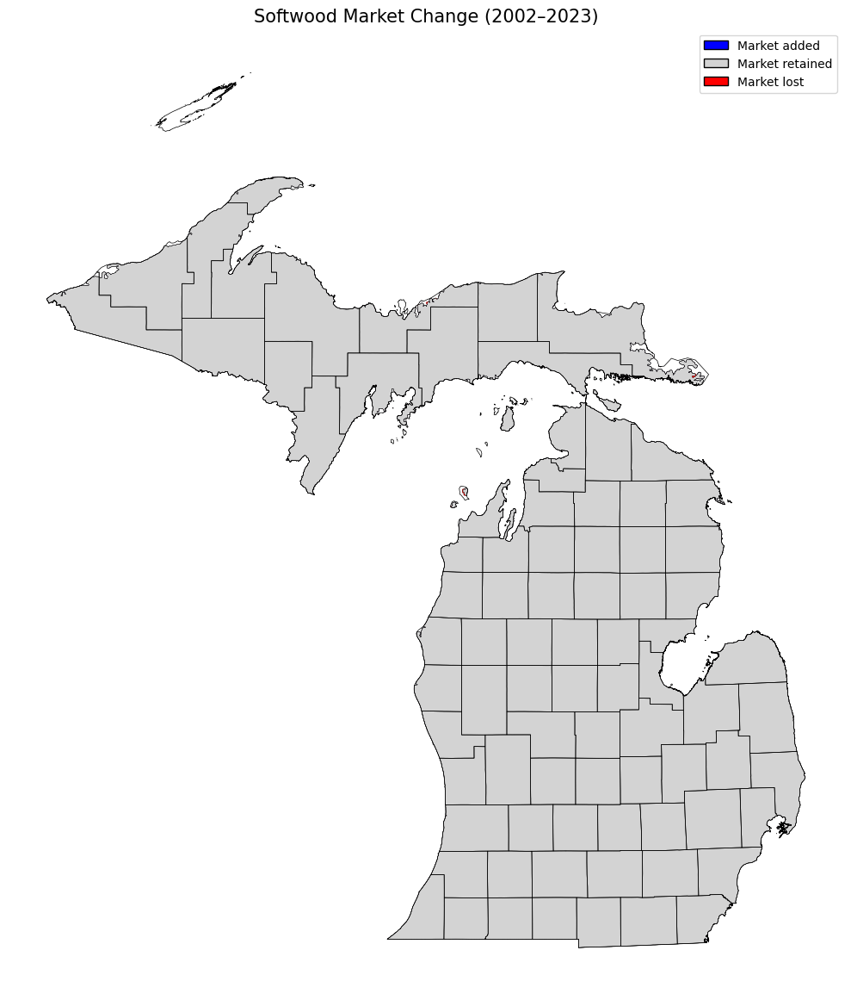

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (use Colab base_path) ---
change_fp   = os.path.join(base_path, "softwood_change_2002-2023.shp")  # <-- updated to softwood 2002–2023
counties_fp = os.path.join(base_path, "Counties_(v17a).shp")

# --- Load ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by status ---
retain = gdf_change[gdf_change["status"] == "Market Retain"]
loss   = gdf_change[gdf_change["status"] == "Market Loss"]
add    = gdf_change[gdf_change["status"] == "Market Add"]

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Softwood Market Change (2002–2023)", fontsize=15)  # <-- updated title
ax.axis('off')
plt.tight_layout()
plt.show()


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Paths from your existing Colab base_path
raster_path    = os.path.join(base_path, "lulc2001.tif")
shapefile_path = os.path.join(base_path, "softwood_change_2002-2023.shp")  # <-- switched to softwood 2002–2023

# ✅ Forest land cover class codes
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# ✅ Open raster
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # ✅ Open shapefile
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # ✅ Loop through features
        for feature in shp:
            polygon_label = feature["properties"].get("status", "unknown")  # 'status' column
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' has a forest area of {forest_area_acres:,.2f} acres.")


In [27]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "softwood_change_2002-2023.shp")  # <-- updated for softwood 2002–2023

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 18763145.97 acres.
   White/Red/Jack Pine Group: 2425829.79 acres
   Spruce/Fir Group: 3210712.49 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Pine Group: 30.89 acres
   Oak/Hickory Group: 154224.41 acres
   Elm/Ash/Cottonwood Group: 179599.00 acres
   Maple/Beech/Birch Group: 4013263.19 acres
   Aspen/Birch Group: 8779347.21 acres

Polygon 'Market Loss' has a forest area of 3243.25 acres.
   White/Red/Jack Pine Group: 216.22 acres
   Spruce/Fir Group: 447.88 acres
   Maple/Beech/Birch Group: 92.66 acres
   Aspen/Birch Group: 2486.49 acres

Polygon 'Market Add' has a forest area of 1127.42 acres.
   White/Red/Jack Pine Group: 262.55 acres
   Spruce/Fir Group: 247.11 acres
   Maple/Beech/Birch Group: 324.33 acres
   Aspen/Birch Group: 293.44 acres



# 🌲 Forest Cover Area Estimation in Michigan (1980s–2020s)

## 📘 Introduction

This project aims to estimate forest cover area in the state of **Michigan** from the **1980s to the 2020s**, focusing on how forest dynamics vary across:

- **Competition levels** (ranging from 1 = lowest to 5 = highest)
- **Forest product types**, including:
  - Hardwood sawlogs
  - Softwood sawlogs
  - Pulpwood
  - Wood biomass

The goal is to analyze how forest cover associated with each product type has changed over time and across different levels of ecological competition. These estimates will help inform sustainable forest management, resource allocation, and long-term planning for timber and biomass industries.

The analysis will be structured by decade and will incorporate historical data, remote sensing insights, and forest inventory records to model trends and identify key patterns in forest utilization and growth.



# Biomass

# 1985

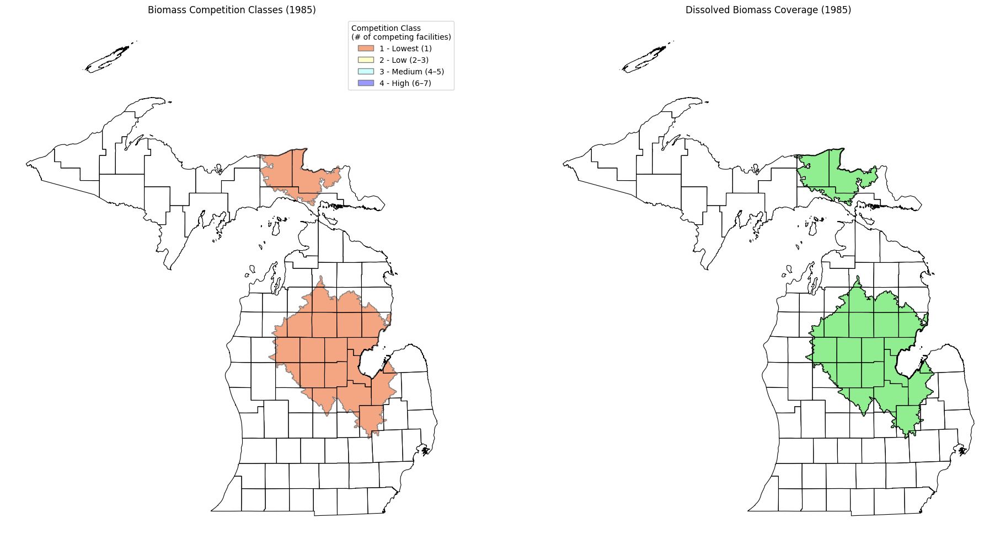

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- File paths (use the base_path you already set in Colab) ---
michigan_fp       = os.path.join(base_path, "Counties_(v17a).shp")
biomass_1985_fp   = os.path.join(base_path, "biomass_hotspots_1985.shp")   # UNDISSOLVED
dissolved_1985_fp = os.path.join(base_path, "biomass_coverage_1985.shp")   # DISSOLVED

# --- Load data ---
gdf_mi    = gpd.read_file(michigan_fp)
gdf_bio   = gpd.read_file(biomass_1985_fp)    # original polygons with classes
gdf_union = gpd.read_file(dissolved_1985_fp)  # dissolved polygon(s)

# --- Reproject if needed ---
if gdf_bio.crs != gdf_mi.crs:
    gdf_bio = gdf_bio.to_crs(gdf_mi.crs)
if gdf_union.crs != gdf_mi.crs:
    gdf_union = gdf_union.to_crs(gdf_mi.crs)

# --- Color map (update if 1985 has a different class scheme) ---
color_map = {
    "1 - Lowest (1985)": "#F4A582",
    "2 - Low (1985)":    "#FFFFCC",
    "3 - Medium (1985)": "#CCFFFF",
    "4 - High (1985)":   "#9999FF"
}

# --- Plot ---
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# Left: original competition polygons
gdf_mi.boundary.plot(ax=axes[0], color='black', linewidth=0.8)
for label, color in color_map.items():
    subset = gdf_bio[gdf_bio["label"] == label]
    if not subset.empty:
        subset.plot(ax=axes[0], color=color, edgecolor='grey')

legend_elements = [
    Patch(facecolor="#F4A582", edgecolor='grey', label="1 - Lowest (1)"),
    Patch(facecolor="#FFFFCC", edgecolor='grey', label="2 - Low (2–3)"),
    Patch(facecolor="#CCFFFF", edgecolor='grey', label="3 - Medium (4–5)"),
    Patch(facecolor="#9999FF", edgecolor='grey', label="4 - High (6–7)")
]
axes[0].legend(handles=legend_elements,
               title="Competition Class\n(# of competing facilities)",
               loc='upper right', frameon=True)
axes[0].set_title("Biomass Competition Classes (1985)")
axes[0].axis("off")

# Right: dissolved biomass area
gdf_mi.boundary.plot(ax=axes[1], color='black', linewidth=0.8)
gdf_union.plot(ax=axes[1], color='lightgreen', edgecolor='black')
axes[1].set_title("Dissolved Biomass Coverage (1985)")
axes[1].axis("off")

plt.tight_layout()
plt.show()


# 1994

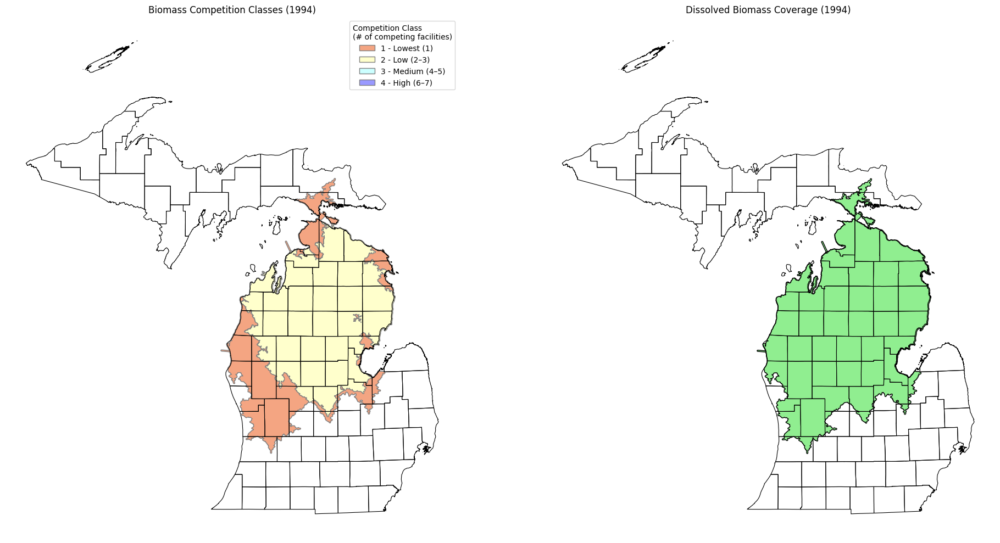

In [28]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- File paths (use the base_path you already set in Colab) ---
michigan_fp       = os.path.join(base_path, "Counties_(v17a).shp")
biomass_1994_fp   = os.path.join(base_path, "biomass_hotspots_1994.shp")   # UNDISSOLVED
dissolved_1994_fp = os.path.join(base_path, "biomass_coverage_1994.shp")   # DISSOLVED

# --- Load data ---
gdf_mi    = gpd.read_file(michigan_fp)
gdf_bio   = gpd.read_file(biomass_1994_fp)    # original polygons with classes
gdf_union = gpd.read_file(dissolved_1994_fp)  # dissolved polygon(s)

# --- Reproject if needed ---
if gdf_bio.crs != gdf_mi.crs:
    gdf_bio = gdf_bio.to_crs(gdf_mi.crs)
if gdf_union.crs != gdf_mi.crs:
    gdf_union = gdf_union.to_crs(gdf_mi.crs)

# --- Color map (updated year tag for 1994) ---
color_map = {
    "1 - Lowest (1994)": "#F4A582",
    "2 - Low (1994)":    "#FFFFCC",
    "3 - Medium (1994)": "#CCFFFF",
    "4 - High (1994)":   "#9999FF"
}

# --- Plot ---
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# Left: original competition polygons
gdf_mi.boundary.plot(ax=axes[0], color='black', linewidth=0.8)
for label, color in color_map.items():
    subset = gdf_bio[gdf_bio["label"] == label]
    if not subset.empty:
        subset.plot(ax=axes[0], color=color, edgecolor='grey')

legend_elements = [
    Patch(facecolor="#F4A582", edgecolor='grey', label="1 - Lowest (1)"),
    Patch(facecolor="#FFFFCC", edgecolor='grey', label="2 - Low (2–3)"),
    Patch(facecolor="#CCFFFF", edgecolor='grey', label="3 - Medium (4–5)"),
    Patch(facecolor="#9999FF", edgecolor='grey', label="4 - High (6–7)")
]
axes[0].legend(handles=legend_elements,
               title="Competition Class\n(# of competing facilities)",
               loc='upper right', frameon=True)
axes[0].set_title("Biomass Competition Classes (1994)")
axes[0].axis("off")

# Right: dissolved biomass area
gdf_mi.boundary.plot(ax=axes[1], color='black', linewidth=0.8)
gdf_union.plot(ax=axes[1], color='lightgreen', edgecolor='black')
axes[1].set_title("Dissolved Biomass Coverage (1994)")
axes[1].axis("off")

plt.tight_layout()
plt.show()


# 2002

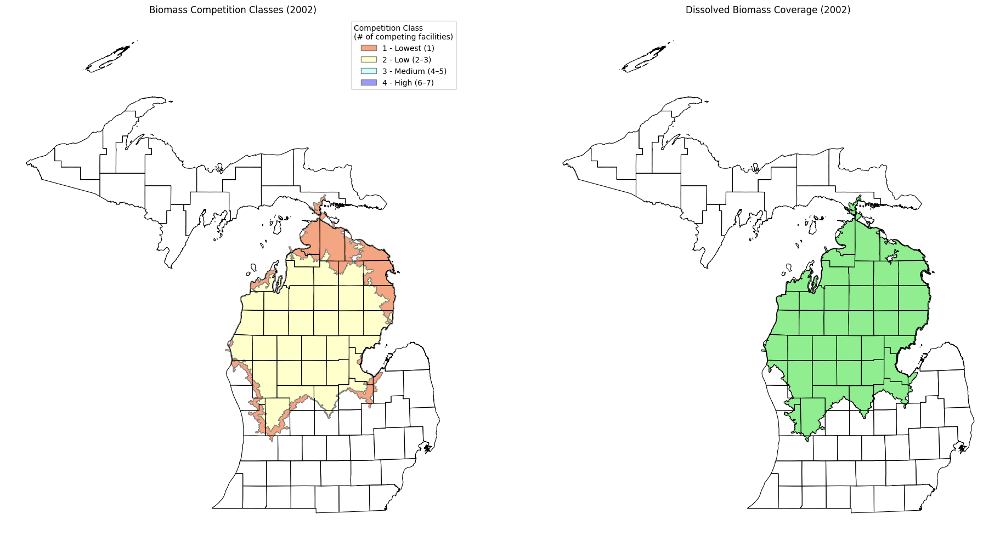

In [29]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- File paths (use the base_path you already set in Colab) ---
michigan_fp       = os.path.join(base_path, "Counties_(v17a).shp")
biomass_2002_fp   = os.path.join(base_path, "biomass_hotspots_2002.shp")   # UNDISSOLVED
dissolved_2002_fp = os.path.join(base_path, "biomass_coverage_2002.shp")   # DISSOLVED

# --- Load data ---
gdf_mi    = gpd.read_file(michigan_fp)
gdf_bio   = gpd.read_file(biomass_2002_fp)    # original polygons with classes
gdf_union = gpd.read_file(dissolved_2002_fp)  # dissolved polygon(s)

# --- Reproject if needed ---
if gdf_bio.crs != gdf_mi.crs:
    gdf_bio = gdf_bio.to_crs(gdf_mi.crs)
if gdf_union.crs != gdf_mi.crs:
    gdf_union = gdf_union.to_crs(gdf_mi.crs)

# --- Color map (updated year tag for 2002) ---
color_map = {
    "1 - Lowest (2002)": "#F4A582",
    "2 - Low (2002)":    "#FFFFCC",
    "3 - Medium (2002)": "#CCFFFF",
    "4 - High (2002)":   "#9999FF"
}

# --- Plot ---
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# Left: original competition polygons
gdf_mi.boundary.plot(ax=axes[0], color='black', linewidth=0.8)
for label, color in color_map.items():
    subset = gdf_bio[gdf_bio["label"] == label]
    if not subset.empty:
        subset.plot(ax=axes[0], color=color, edgecolor='grey')

legend_elements = [
    Patch(facecolor="#F4A582", edgecolor='grey', label="1 - Lowest (1)"),
    Patch(facecolor="#FFFFCC", edgecolor='grey', label="2 - Low (2–3)"),
    Patch(facecolor="#CCFFFF", edgecolor='grey', label="3 - Medium (4–5)"),
    Patch(facecolor="#9999FF", edgecolor='grey', label="4 - High (6–7)")
]
axes[0].legend(handles=legend_elements,
               title="Competition Class\n(# of competing facilities)",
               loc='upper right', frameon=True)
axes[0].set_title("Biomass Competition Classes (2002)")
axes[0].axis("off")

# Right: dissolved biomass area
gdf_mi.boundary.plot(ax=axes[1], color='black', linewidth=0.8)
gdf_union.plot(ax=axes[1], color='lightgreen', edgecolor='black')
axes[1].set_title("Dissolved Biomass Coverage (2002)")
axes[1].axis("off")

plt.tight_layout()
plt.show()


# 2018

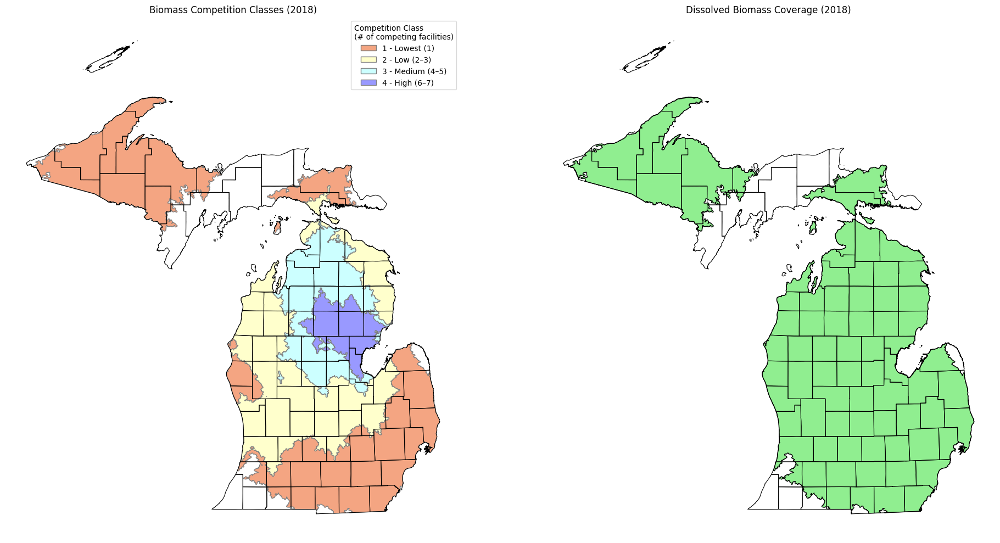

In [30]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- File paths (use the base_path you already set in Colab) ---
michigan_fp       = os.path.join(base_path, "Counties_(v17a).shp")
biomass_2018_fp   = os.path.join(base_path, "biomass_hotspots_2018.shp")   # UNDISSOLVED
dissolved_2018_fp = os.path.join(base_path, "biomass_coverage_2018.shp")   # DISSOLVED

# --- Load data ---
gdf_mi    = gpd.read_file(michigan_fp)
gdf_bio   = gpd.read_file(biomass_2018_fp)    # original polygons with classes
gdf_union = gpd.read_file(dissolved_2018_fp)  # dissolved polygon(s)

# --- Reproject if needed ---
if gdf_bio.crs != gdf_mi.crs:
    gdf_bio = gdf_bio.to_crs(gdf_mi.crs)
if gdf_union.crs != gdf_mi.crs:
    gdf_union = gdf_union.to_crs(gdf_mi.crs)

# --- Color map (updated year tag for 2018) ---
color_map = {
    "1 - Lowest (2018)": "#F4A582",
    "2 - Low (2018)":    "#FFFFCC",
    "3 - Medium (2018)": "#CCFFFF",
    "4 - High (2018)":   "#9999FF"
}

# --- Plot ---
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# Left: original competition polygons
gdf_mi.boundary.plot(ax=axes[0], color='black', linewidth=0.8)
for label, color in color_map.items():
    subset = gdf_bio[gdf_bio["label"] == label]
    if not subset.empty:
        subset.plot(ax=axes[0], color=color, edgecolor='grey')

legend_elements = [
    Patch(facecolor="#F4A582", edgecolor='grey', label="1 - Lowest (1)"),
    Patch(facecolor="#FFFFCC", edgecolor='grey', label="2 - Low (2–3)"),
    Patch(facecolor="#CCFFFF", edgecolor='grey', label="3 - Medium (4–5)"),
    Patch(facecolor="#9999FF", edgecolor='grey', label="4 - High (6–7)")
]
axes[0].legend(handles=legend_elements,
               title="Competition Class\n(# of competing facilities)",
               loc='upper right', frameon=True)
axes[0].set_title("Biomass Competition Classes (2018)")
axes[0].axis("off")

# Right: dissolved biomass area
gdf_mi.boundary.plot(ax=axes[1], color='black', linewidth=0.8)
gdf_union.plot(ax=axes[1], color='lightgreen', edgecolor='black')
axes[1].set_title("Dissolved Biomass Coverage (2018)")
axes[1].axis("off")

plt.tight_layout()
plt.show()


# 2023

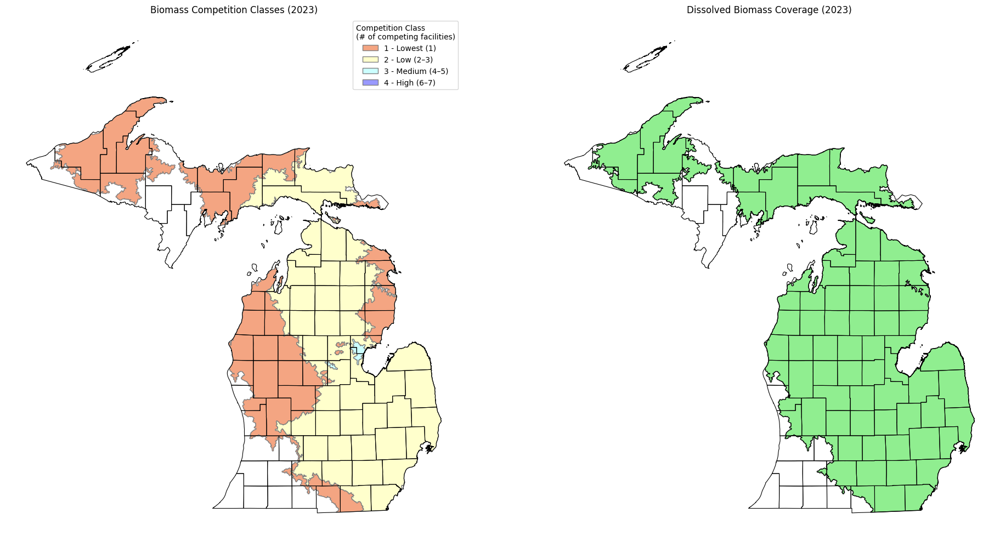

In [31]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- File paths (use the base_path you already set in Colab) ---
michigan_fp       = os.path.join(base_path, "Counties_(v17a).shp")
biomass_2023_fp   = os.path.join(base_path, "biomass_hotspots_2023.shp")   # UNDISSOLVED
dissolved_2023_fp = os.path.join(base_path, "biomass_coverage_2023.shp")   # DISSOLVED

# --- Load data ---
gdf_mi    = gpd.read_file(michigan_fp)
gdf_bio   = gpd.read_file(biomass_2023_fp)    # original polygons with classes
gdf_union = gpd.read_file(dissolved_2023_fp)  # dissolved polygon(s)

# --- Reproject if needed ---
if gdf_bio.crs != gdf_mi.crs:
    gdf_bio = gdf_bio.to_crs(gdf_mi.crs)
if gdf_union.crs != gdf_mi.crs:
    gdf_union = gdf_union.to_crs(gdf_mi.crs)

# --- Color map (updated year tag for 2023) ---
color_map = {
    "1 - Lowest (2023)": "#F4A582",
    "2 - Low (2023)":    "#FFFFCC",
    "3 - Medium (2023)": "#CCFFFF",
    "4 - High (2023)":   "#9999FF"
}

# --- Plot ---
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# Left: original competition polygons
gdf_mi.boundary.plot(ax=axes[0], color='black', linewidth=0.8)
for label, color in color_map.items():
    subset = gdf_bio[gdf_bio["label"] == label]
    if not subset.empty:
        subset.plot(ax=axes[0], color=color, edgecolor='grey')

legend_elements = [
    Patch(facecolor="#F4A582", edgecolor='grey', label="1 - Lowest (1)"),
    Patch(facecolor="#FFFFCC", edgecolor='grey', label="2 - Low (2–3)"),
    Patch(facecolor="#CCFFFF", edgecolor='grey', label="3 - Medium (4–5)"),
    Patch(facecolor="#9999FF", edgecolor='grey', label="4 - High (6–7)")
]
axes[0].legend(handles=legend_elements,
               title="Competition Class\n(# of competing facilities)",
               loc='upper right', frameon=True)
axes[0].set_title("Biomass Competition Classes (2023)")
axes[0].axis("off")

# Right: dissolved biomass area
gdf_mi.boundary.plot(ax=axes[1], color='black', linewidth=0.8)
gdf_union.plot(ax=axes[1], color='lightgreen', edgecolor='black')
axes[1].set_title("Dissolved Biomass Coverage (2023)")
axes[1].axis("off")

plt.tight_layout()
plt.show()


# Pulpwood

# 1985

# Pulpwood

✅ Saved dissolved shapefile to: C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Hotspots disolved July 27\Data\pulpwood_coverage_1985.shp


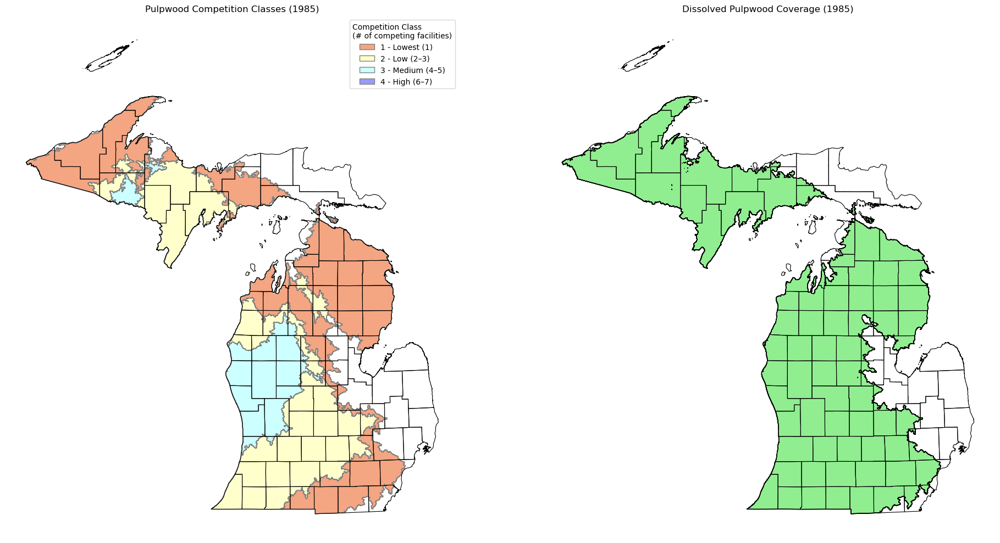

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- File paths ---
base_path = r"C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Hotspots disolved July 27\Data"
michigan_fp = os.path.join(base_path, "Counties_(v17a).shp")
pulpwood_1985_fp = os.path.join(base_path, "pulpwood_hotspots_1985.shp")
dissolved_pulpwood_fp = os.path.join(base_path, "pulpwood_coverage_1985.shp")

# --- Load data ---
gdf_mi = gpd.read_file(michigan_fp)
gdf_pulp = gpd.read_file(pulpwood_1985_fp)

# --- Reproject if needed ---
if gdf_pulp.crs != gdf_mi.crs:
    gdf_pulp = gdf_pulp.to_crs(gdf_mi.crs)

# --- Dissolve polygons and save ---
gdf_union = gdf_pulp.dissolve().reset_index(drop=True)
gdf_union["id"] = 1
gdf_union.to_file(dissolved_pulpwood_fp)
print("✅ Saved dissolved shapefile to:", dissolved_pulpwood_fp)

# --- Reload dissolved file to confirm ---
gdf_union = gpd.read_file(dissolved_pulpwood_fp)

# --- Color map for pulpwood competition classes ---
color_map = {
    "1 - Lowest (1985)": "#F4A582",
    "2 - Low (1985)": "#FFFFCC",
    "3 - Medium (1985)": "#CCFFFF",
    "4 - High (1985)": "#9999FF"
}

# --- Plot ---
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# === Left: Original classified polygons ===
gdf_mi.boundary.plot(ax=axes[0], color='black', linewidth=0.8)
for label, color in color_map.items():
    subset = gdf_pulp[gdf_pulp["label"] == label]
    if not subset.empty:
        subset.plot(ax=axes[0], color=color, edgecolor='grey')

# Legend
legend_elements = [
    Patch(facecolor="#F4A582", edgecolor='grey', label="1 - Lowest (1)"),
    Patch(facecolor="#FFFFCC", edgecolor='grey', label="2 - Low (2–3)"),
    Patch(facecolor="#CCFFFF", edgecolor='grey', label="3 - Medium (4–5)"),
    Patch(facecolor="#9999FF", edgecolor='grey', label="4 - High (6–7)")
]
axes[0].legend(handles=legend_elements,
               title="Competition Class\n(# of competing facilities)",
               loc='upper right', frameon=True)
axes[0].set_title("Pulpwood Competition Classes (1985)")
axes[0].axis("off")

# === Right: Dissolved polygon ===
gdf_mi.boundary.plot(ax=axes[1], color='black', linewidth=0.8)
gdf_union.plot(ax=axes[1], color='lightgreen', edgecolor='black')
axes[1].set_title("Dissolved Pulpwood Coverage (1985)")
axes[1].axis("off")

plt.tight_layout()
plt.show()


✅ Saved dissolved shapefile to: C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Hotspots disolved July 27\Data\pulpwood_coverage_1994.shp


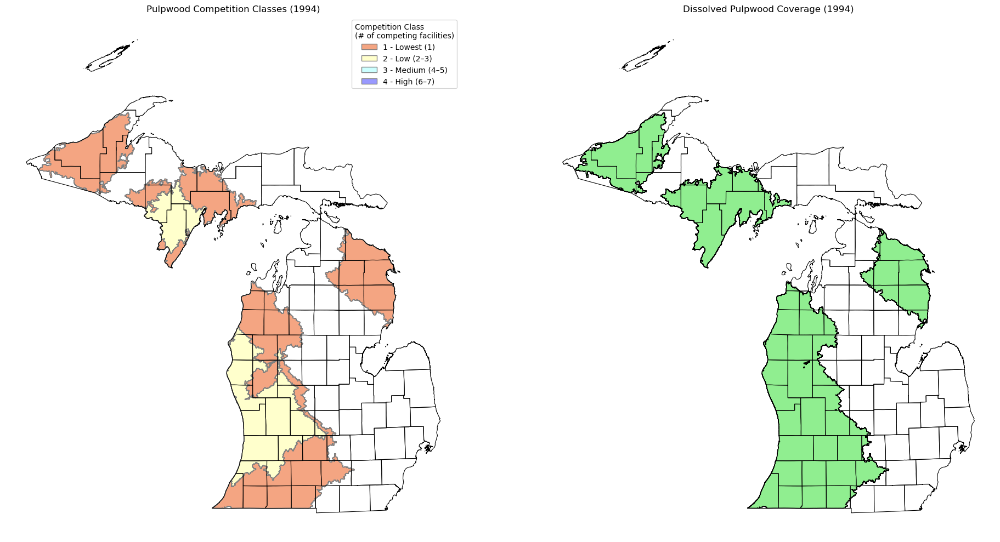

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- File paths ---
base_path = r"C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Hotspots disolved July 27\Data"
michigan_fp = os.path.join(base_path, "Counties_(v17a).shp")
pulpwood_1994_fp = os.path.join(base_path, "pulpwood_hotspots_1994.shp")
dissolved_pulpwood_fp = os.path.join(base_path, "pulpwood_coverage_1994.shp")

# --- Load data ---
gdf_mi = gpd.read_file(michigan_fp)
gdf_pulp = gpd.read_file(pulpwood_1994_fp)

# --- Reproject if needed ---
if gdf_pulp.crs != gdf_mi.crs:
    gdf_pulp = gdf_pulp.to_crs(gdf_mi.crs)

# --- Dissolve polygons and save ---
gdf_union = gdf_pulp.dissolve().reset_index(drop=True)
gdf_union["id"] = 1
gdf_union.to_file(dissolved_pulpwood_fp)
print("✅ Saved dissolved shapefile to:", dissolved_pulpwood_fp)

# --- Reload dissolved file to confirm ---
gdf_union = gpd.read_file(dissolved_pulpwood_fp)

# --- Color map for pulpwood competition classes ---
color_map = {
    "1 - Lowest (1994)": "#F4A582",
    "2 - Low (1994)": "#FFFFCC",
    "3 - Medium (1994)": "#CCFFFF",
    "4 - High (1994)": "#9999FF"
}

# --- Plot ---
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# === Left: Original classified polygons ===
gdf_mi.boundary.plot(ax=axes[0], color='black', linewidth=0.8)
for label, color in color_map.items():
    subset = gdf_pulp[gdf_pulp["label"] == label]
    if not subset.empty:
        subset.plot(ax=axes[0], color=color, edgecolor='grey')

# Legend
legend_elements = [
    Patch(facecolor="#F4A582", edgecolor='grey', label="1 - Lowest (1)"),
    Patch(facecolor="#FFFFCC", edgecolor='grey', label="2 - Low (2–3)"),
    Patch(facecolor="#CCFFFF", edgecolor='grey', label="3 - Medium (4–5)"),
    Patch(facecolor="#9999FF", edgecolor='grey', label="4 - High (6–7)")
]
axes[0].legend(handles=legend_elements,
               title="Competition Class\n(# of competing facilities)",
               loc='upper right', frameon=True)
axes[0].set_title("Pulpwood Competition Classes (1994)")
axes[0].axis("off")

# === Right: Dissolved polygon ===
gdf_mi.boundary.plot(ax=axes[1], color='black', linewidth=0.8)
gdf_union.plot(ax=axes[1], color='lightgreen', edgecolor='black')
axes[1].set_title("Dissolved Pulpwood Coverage (1994)")
axes[1].axis("off")

plt.tight_layout()
plt.show()


✅ Saved dissolved shapefile to: C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Hotspots disolved July 27\Data\pulpwood_coverage_2002.shp


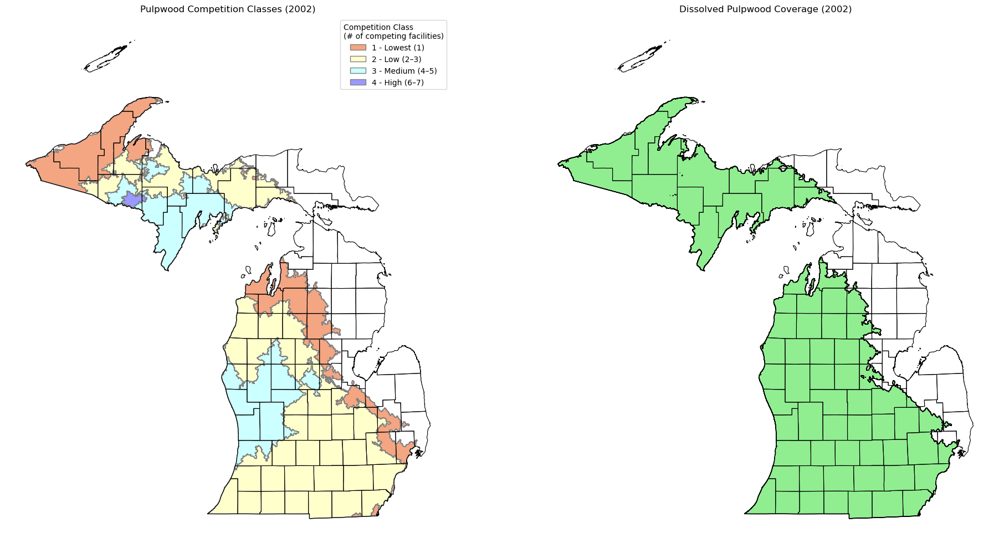

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- File paths ---
base_path = r"C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Hotspots disolved July 27\Data"
michigan_fp = os.path.join(base_path, "Counties_(v17a).shp")
pulpwood_2002_fp = os.path.join(base_path, "pulpwood_hotspots_2002.shp")
dissolved_pulpwood_fp = os.path.join(base_path, "pulpwood_coverage_2002.shp")

# --- Load data ---
gdf_mi = gpd.read_file(michigan_fp)
gdf_pulp = gpd.read_file(pulpwood_2002_fp)

# --- Reproject if needed ---
if gdf_pulp.crs != gdf_mi.crs:
    gdf_pulp = gdf_pulp.to_crs(gdf_mi.crs)

# --- Dissolve polygons and save ---
gdf_union = gdf_pulp.dissolve().reset_index(drop=True)
gdf_union["id"] = 1
gdf_union.to_file(dissolved_pulpwood_fp)
print("✅ Saved dissolved shapefile to:", dissolved_pulpwood_fp)

# --- Reload dissolved file to confirm ---
gdf_union = gpd.read_file(dissolved_pulpwood_fp)

# --- Color map for pulpwood competition classes ---
color_map = {
    "1 - Lowest (2002)": "#F4A582",
    "2 - Low (2002)": "#FFFFCC",
    "3 - Medium (2002)": "#CCFFFF",
    "4 - High (2002)": "#9999FF"
}

# --- Plot ---
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# === Left: Original classified polygons ===
gdf_mi.boundary.plot(ax=axes[0], color='black', linewidth=0.8)
for label, color in color_map.items():
    subset = gdf_pulp[gdf_pulp["label"] == label]
    if not subset.empty:
        subset.plot(ax=axes[0], color=color, edgecolor='grey')

# Legend
legend_elements = [
    Patch(facecolor="#F4A582", edgecolor='grey', label="1 - Lowest (1)"),
    Patch(facecolor="#FFFFCC", edgecolor='grey', label="2 - Low (2–3)"),
    Patch(facecolor="#CCFFFF", edgecolor='grey', label="3 - Medium (4–5)"),
    Patch(facecolor="#9999FF", edgecolor='grey', label="4 - High (6–7)")
]
axes[0].legend(handles=legend_elements,
               title="Competition Class\n(# of competing facilities)",
               loc='upper right', frameon=True)
axes[0].set_title("Pulpwood Competition Classes (2002)")
axes[0].axis("off")

# === Right: Dissolved polygon ===
gdf_mi.boundary.plot(ax=axes[1], color='black', linewidth=0.8)
gdf_union.plot(ax=axes[1], color='lightgreen', edgecolor='black')
axes[1].set_title("Dissolved Pulpwood Coverage (2002)")
axes[1].axis("off")

plt.tight_layout()
plt.show()


✅ Saved dissolved shapefile to: C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Hotspots disolved July 27\Data\pulpwood_coverage_2018.shp


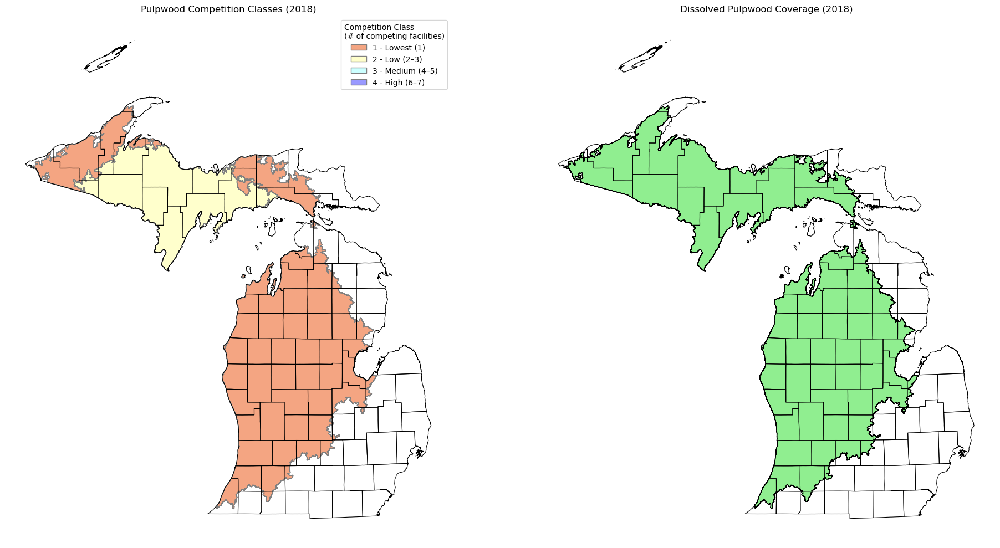

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- File paths ---
base_path = r"C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Hotspots disolved July 27\Data"
michigan_fp = os.path.join(base_path, "Counties_(v17a).shp")
pulpwood_2018_fp = os.path.join(base_path, "pulpwood_hotspots_2018.shp")
dissolved_pulpwood_fp = os.path.join(base_path, "pulpwood_coverage_2018.shp")

# --- Load data ---
gdf_mi = gpd.read_file(michigan_fp)
gdf_pulp = gpd.read_file(pulpwood_2018_fp)

# --- Reproject if needed ---
if gdf_pulp.crs != gdf_mi.crs:
    gdf_pulp = gdf_pulp.to_crs(gdf_mi.crs)

# --- Dissolve polygons and save ---
gdf_union = gdf_pulp.dissolve().reset_index(drop=True)
gdf_union["id"] = 1
gdf_union.to_file(dissolved_pulpwood_fp)
print("✅ Saved dissolved shapefile to:", dissolved_pulpwood_fp)

# --- Reload dissolved file to confirm ---
gdf_union = gpd.read_file(dissolved_pulpwood_fp)

# --- Color map for pulpwood competition classes ---
color_map = {
    "1 - Lowest (2018)": "#F4A582",
    "2 - Low (2018)": "#FFFFCC",
    "3 - Medium (2018)": "#CCFFFF",
    "4 - High (2018)": "#9999FF"
}

# --- Plot ---
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# === Left: Original classified polygons ===
gdf_mi.boundary.plot(ax=axes[0], color='black', linewidth=0.8)
for label, color in color_map.items():
    subset = gdf_pulp[gdf_pulp["label"] == label]
    if not subset.empty:
        subset.plot(ax=axes[0], color=color, edgecolor='grey')

# Legend
legend_elements = [
    Patch(facecolor="#F4A582", edgecolor='grey', label="1 - Lowest (1)"),
    Patch(facecolor="#FFFFCC", edgecolor='grey', label="2 - Low (2–3)"),
    Patch(facecolor="#CCFFFF", edgecolor='grey', label="3 - Medium (4–5)"),
    Patch(facecolor="#9999FF", edgecolor='grey', label="4 - High (6–7)")
]
axes[0].legend(handles=legend_elements,
               title="Competition Class\n(# of competing facilities)",
               loc='upper right', frameon=True)
axes[0].set_title("Pulpwood Competition Classes (2018)")
axes[0].axis("off")

# === Right: Dissolved polygon ===
gdf_mi.boundary.plot(ax=axes[1], color='black', linewidth=0.8)
gdf_union.plot(ax=axes[1], color='lightgreen', edgecolor='black')
axes[1].set_title("Dissolved Pulpwood Coverage (2018)")
axes[1].axis("off")

plt.tight_layout()
plt.show()


✅ Saved dissolved shapefile to: C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Hotspots disolved July 27\Data\pulpwood_coverage_2023.shp


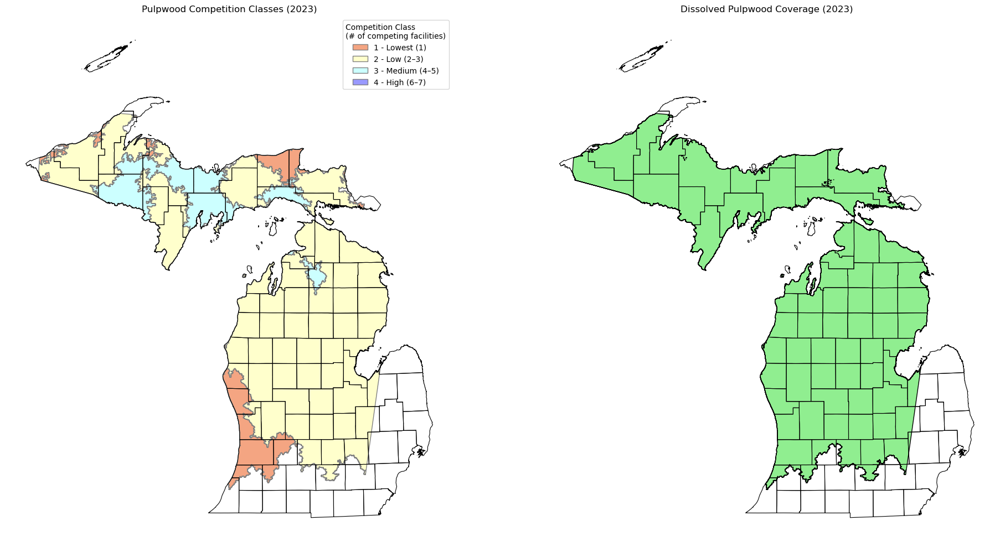

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- File paths ---
base_path = r"C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Hotspots disolved July 27\Data"
michigan_fp = os.path.join(base_path, "Counties_(v17a).shp")
pulpwood_2023_fp = os.path.join(base_path, "pulpwood_hotspots_2023.shp")
dissolved_pulpwood_fp = os.path.join(base_path, "pulpwood_coverage_2023.shp")

# --- Load data ---
gdf_mi = gpd.read_file(michigan_fp)
gdf_pulp = gpd.read_file(pulpwood_2023_fp)

# --- Reproject if needed ---
if gdf_pulp.crs != gdf_mi.crs:
    gdf_pulp = gdf_pulp.to_crs(gdf_mi.crs)

# --- Dissolve polygons and save ---
gdf_union = gdf_pulp.dissolve().reset_index(drop=True)
gdf_union["id"] = 1
gdf_union.to_file(dissolved_pulpwood_fp)
print("✅ Saved dissolved shapefile to:", dissolved_pulpwood_fp)

# --- Reload dissolved file to confirm ---
gdf_union = gpd.read_file(dissolved_pulpwood_fp)

# --- Color map for pulpwood competition classes ---
color_map = {
    "1 - Lowest (2023)": "#F4A582",
    "2 - Low (2023)": "#FFFFCC",
    "3 - Medium (2023)": "#CCFFFF",
    "4 - High (2023)": "#9999FF"
}

# --- Plot ---
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# === Left: Original classified polygons ===
gdf_mi.boundary.plot(ax=axes[0], color='black', linewidth=0.8)
for label, color in color_map.items():
    subset = gdf_pulp[gdf_pulp["label"] == label]
    if not subset.empty:
        subset.plot(ax=axes[0], color=color, edgecolor='grey')

# Legend
legend_elements = [
    Patch(facecolor="#F4A582", edgecolor='grey', label="1 - Lowest (1)"),
    Patch(facecolor="#FFFFCC", edgecolor='grey', label="2 - Low (2–3)"),
    Patch(facecolor="#CCFFFF", edgecolor='grey', label="3 - Medium (4–5)"),
    Patch(facecolor="#9999FF", edgecolor='grey', label="4 - High (6–7)")
]
axes[0].legend(handles=legend_elements,
               title="Competition Class\n(# of competing facilities)",
               loc='upper right', frameon=True)
axes[0].set_title("Pulpwood Competition Classes (2023)")
axes[0].axis("off")

# === Right: Dissolved polygon ===
gdf_mi.boundary.plot(ax=axes[1], color='black', linewidth=0.8)
gdf_union.plot(ax=axes[1], color='lightgreen', edgecolor='black')
axes[1].set_title("Dissolved Pulpwood Coverage (2023)")
axes[1].axis("off")

plt.tight_layout()
plt.show()


C:\Users\khanalna\AppData\Local\Temp\ipykernel_21104\2845533535.py:25: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  geom_1985 = gdf_1985.unary_union
C:\Users\khanalna\AppData\Local\Temp\ipykernel_21104\2845533535.py:26: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  geom_2023 = gdf_2023.unary_union


✅ Shapefile saved to: C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Hotspots disolved July 27\Data\pulpwood_change_1985-2023.shp


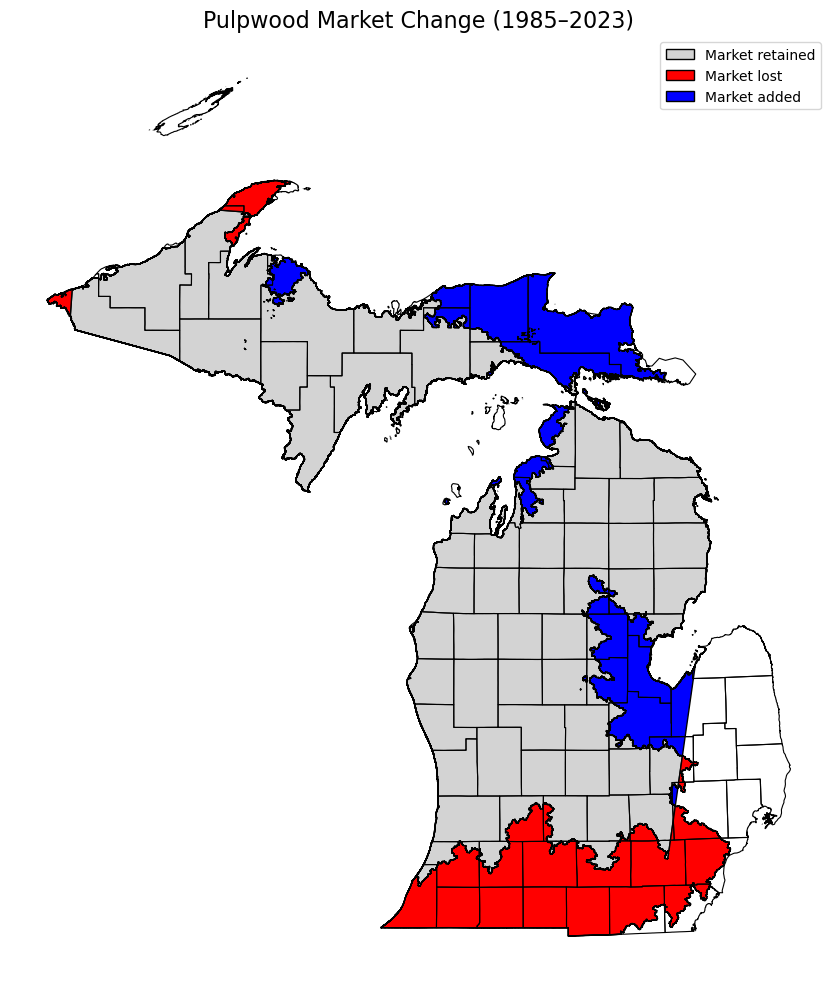

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths ---
base_path = r"C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Hotspots disolved July 27\Data"
coverage_1985_fp = os.path.join(base_path, "pulpwood_coverage_1985.shp")
coverage_2023_fp = os.path.join(base_path, "pulpwood_coverage_2023.shp")
change_fp = os.path.join(base_path, "pulpwood_change_1985-2023.shp")
michigan_fp = os.path.join(base_path, "Counties_(v17a).shp")

# --- Load input data ---
gdf_1985 = gpd.read_file(coverage_1985_fp)
gdf_2023 = gpd.read_file(coverage_2023_fp)
gdf_mi = gpd.read_file(michigan_fp)

# --- Reproject if needed ---
if gdf_1985.crs != gdf_2023.crs:
    gdf_2023 = gdf_2023.to_crs(gdf_1985.crs)
if gdf_1985.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_1985.crs)

# --- Geometry union ---
geom_1985 = gdf_1985.unary_union
geom_2023 = gdf_2023.unary_union

# --- Calculate change types ---
retain = geom_1985.intersection(geom_2023)
loss = geom_1985.difference(geom_2023)
add = geom_2023.difference(geom_1985)

# --- Build and save GeoDataFrame ---
gdf_change = gpd.GeoDataFrame({
    "status": ["Market Retain", "Market Loss", "Market Add"],
    "geometry": [retain, loss, add]
}, crs=gdf_1985.crs)

gdf_change.to_file(change_fp)
print("✅ Shapefile saved to:", change_fp)

# --- Color mapping ---
color_map = {
    "Market Retain": "#D3D3D3",  # Light gray
    "Market Loss": "#FF0000",    # Red
    "Market Add": "#0000FF"      # Blue
}

# --- Plot ---
fig, ax = plt.subplots(figsize=(12, 10))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.8)

for status, color in color_map.items():
    gdf_change[gdf_change["status"] == status].plot(ax=ax, color=color, edgecolor='black')

# --- Legend ---
legend_elements = [
    Patch(facecolor=color_map["Market Retain"], edgecolor='black', label="Market retained"),
    Patch(facecolor=color_map["Market Loss"], edgecolor='black', label="Market lost"),
    Patch(facecolor=color_map["Market Add"], edgecolor='black', label="Market added")
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True)
ax.set_title("Pulpwood Market Change (1985–2023)", fontsize=16)
ax.axis("off")
plt.tight_layout()
plt.show()


C:\Users\khanalna\AppData\Local\Temp\ipykernel_21104\1939457959.py:41: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  geom_1994 = gdf_1994.unary_union
C:\Users\khanalna\AppData\Local\Temp\ipykernel_21104\1939457959.py:42: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  geom_2023 = gdf_2023.unary_union


✅ Shapefile saved to: C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Hotspots disolved July 27\Data\pulpwood_change_1994-2023.shp


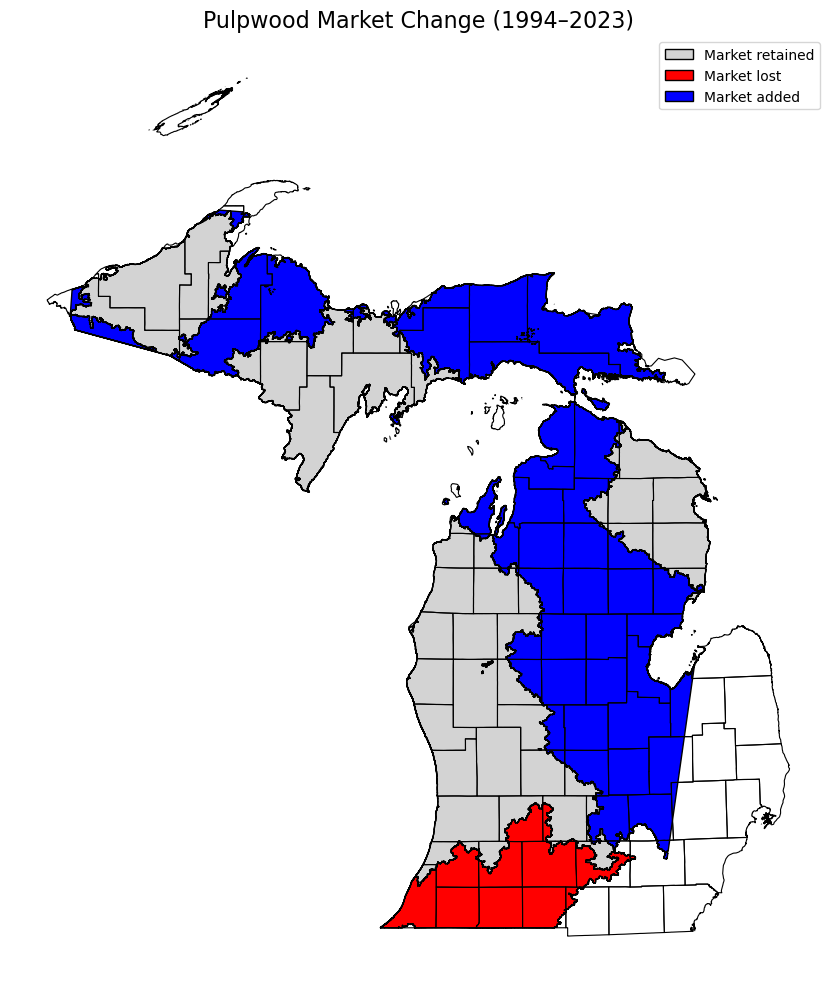

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os
from shapely.geometry import GeometryCollection, MultiPolygon, Polygon

# --- Helper function to sanitize geometry ---
def flatten_geometry(geom):
    if geom.is_empty:
        return None
    elif isinstance(geom, (Polygon, MultiPolygon)):
        return geom
    elif isinstance(geom, GeometryCollection):
        # Extract only Polygon or MultiPolygon parts
        polys = [g for g in geom.geoms if isinstance(g, (Polygon, MultiPolygon))]
        if not polys:
            return None
        return MultiPolygon(polys) if len(polys) > 1 else polys[0]
    else:
        return None

# --- Paths ---
base_path = r"C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Hotspots disolved July 27\Data"
coverage_1994_fp = os.path.join(base_path, "pulpwood_coverage_1994.shp")
coverage_2023_fp = os.path.join(base_path, "pulpwood_coverage_2023.shp")
change_fp = os.path.join(base_path, "pulpwood_change_1994-2023.shp")
michigan_fp = os.path.join(base_path, "Counties_(v17a).shp")

# --- Load input data ---
gdf_1994 = gpd.read_file(coverage_1994_fp)
gdf_2023 = gpd.read_file(coverage_2023_fp)
gdf_mi = gpd.read_file(michigan_fp)

# --- Reproject if needed ---
if gdf_1994.crs != gdf_2023.crs:
    gdf_2023 = gdf_2023.to_crs(gdf_1994.crs)
if gdf_1994.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_1994.crs)

# --- Union geometries ---
geom_1994 = gdf_1994.unary_union
geom_2023 = gdf_2023.unary_union

# --- Compute change geometries and flatten ---
retain = flatten_geometry(geom_1994.intersection(geom_2023))
loss = flatten_geometry(geom_1994.difference(geom_2023))
add = flatten_geometry(geom_2023.difference(geom_1994))

# --- Build cleaned GeoDataFrame ---
status_list = []
geometry_list = []

if retain: status_list.append("Market Retain"); geometry_list.append(retain)
if loss:   status_list.append("Market Loss");   geometry_list.append(loss)
if add:    status_list.append("Market Add");    geometry_list.append(add)

gdf_change = gpd.GeoDataFrame({
    "status": status_list,
    "geometry": geometry_list
}, crs=gdf_1994.crs)

# --- Save shapefile safely ---
gdf_change.to_file(change_fp)
print("✅ Shapefile saved to:", change_fp)

# --- Color mapping ---
color_map = {
    "Market Retain": "#D3D3D3",
    "Market Loss": "#FF0000",
    "Market Add": "#0000FF"
}

# --- Plot ---
fig, ax = plt.subplots(figsize=(12, 10))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.8)

for status, color in color_map.items():
    subset = gdf_change[gdf_change["status"] == status]
    if not subset.empty:
        subset.plot(ax=ax, color=color, edgecolor='black')

# --- Legend ---
legend_elements = [
    Patch(facecolor=color_map["Market Retain"], edgecolor='black', label="Market retained"),
    Patch(facecolor=color_map["Market Loss"], edgecolor='black', label="Market lost"),
    Patch(facecolor=color_map["Market Add"], edgecolor='black', label="Market added")
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True)
ax.set_title("Pulpwood Market Change (1994–2023)", fontsize=16)
ax.axis("off")
plt.tight_layout()
plt.show()


C:\Users\khanalna\AppData\Local\Temp\ipykernel_21104\1690538451.py:25: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  geom_2002 = gdf_2002.unary_union
C:\Users\khanalna\AppData\Local\Temp\ipykernel_21104\1690538451.py:26: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  geom_2023 = gdf_2023.unary_union


✅ Shapefile saved to: C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Hotspots disolved July 27\Data\pulpwood_change_2002-2023.shp


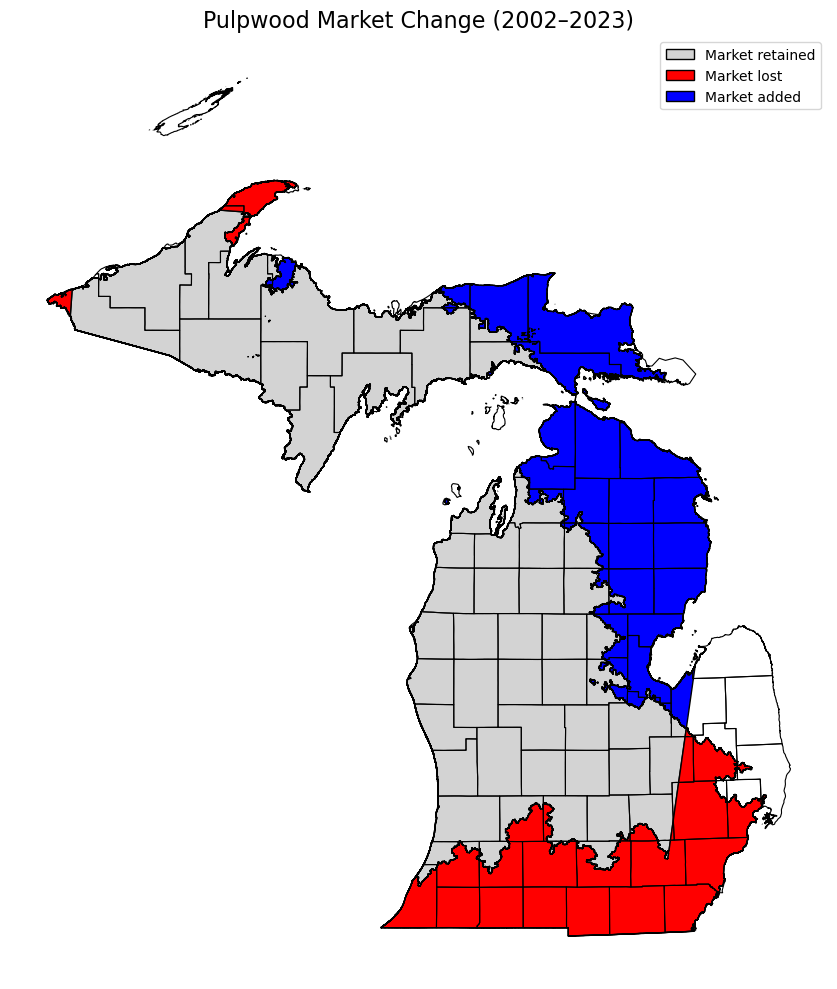

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths ---
base_path = r"C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Hotspots disolved July 27\Data"
coverage_2002_fp = os.path.join(base_path, "pulpwood_coverage_2002.shp")
coverage_2023_fp = os.path.join(base_path, "pulpwood_coverage_2023.shp")
change_fp = os.path.join(base_path, "pulpwood_change_2002-2023.shp")
michigan_fp = os.path.join(base_path, "Counties_(v17a).shp")

# --- Load input data ---
gdf_2002 = gpd.read_file(coverage_2002_fp)
gdf_2023 = gpd.read_file(coverage_2023_fp)
gdf_mi = gpd.read_file(michigan_fp)

# --- Reproject if needed ---
if gdf_2002.crs != gdf_2023.crs:
    gdf_2023 = gdf_2023.to_crs(gdf_2002.crs)
if gdf_2002.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_2002.crs)

# --- Geometry union ---
geom_2002 = gdf_2002.unary_union
geom_2023 = gdf_2023.unary_union

# --- Calculate change types ---
retain = geom_2002.intersection(geom_2023)
loss = geom_2002.difference(geom_2023)
add = geom_2023.difference(geom_2002)

# --- Build and save GeoDataFrame ---
gdf_change = gpd.GeoDataFrame({
    "status": ["Market Retain", "Market Loss", "Market Add"],
    "geometry": [retain, loss, add]
}, crs=gdf_2002.crs)

gdf_change.to_file(change_fp)
print("✅ Shapefile saved to:", change_fp)

# --- Color mapping ---
color_map = {
    "Market Retain": "#D3D3D3",  # Light gray
    "Market Loss": "#FF0000",    # Red
    "Market Add": "#0000FF"      # Blue
}

# --- Plot ---
fig, ax = plt.subplots(figsize=(12, 10))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.8)

for status, color in color_map.items():
    gdf_change[gdf_change["status"] == status].plot(ax=ax, color=color, edgecolor='black')

# --- Legend ---
legend_elements = [
    Patch(facecolor=color_map["Market Retain"], edgecolor='black', label="Market retained"),
    Patch(facecolor=color_map["Market Loss"], edgecolor='black', label="Market lost"),
    Patch(facecolor=color_map["Market Add"], edgecolor='black', label="Market added")
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True)
ax.set_title("Pulpwood Market Change (2002–2023)", fontsize=16)
ax.axis("off")
plt.tight_layout()
plt.show()
